In [16]:
import time
import os
import math
import cv2
import numpy as np
import pandas as pd
import pyautogui as pa
import shutil
import imageio
import re  # regex
from PIL import Image, ImageDraw
import random
from scipy.stats import sem, ttest_ind, norm

from lib.analysis.trace_metrics import TraceMetrics
from lib.analysis.false_discovery_control import false_discovery_control
from lib.auto_GUI.auto_PhotoZ import AutoPhotoZ
from lib.analysis.laminar_dist import *
from lib.file.TIF import *
from lib.analysis.align import ImageAlign
from lib.utilities import *
from lib.file.ROI_writer import ROIFileWriter
from lib.file.ROI_reader import ROIFileReader
from lib.analysis.barrel_roi import Barrel_ROI_Creator
from lib.analysis.cell_roi import RandomROISample, OverlapCounterROI
from lib.analysis.baseline_correction import BaselineCorrection

# 2-way ANOVA for medial and lateral PPR vs IPI
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
import statsmodels.api as sm

In [4]:
# load trace files from the following directory
data_dir = "C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR/"
ppr_coronal_df = data_dir + "export_summary_backup_coronal.csv"

camera_program = 4
um_per_px = 6.0 #um

# load the CSV
ppr_coronal_df = pd.read_csv(ppr_coronal_df)
ppr_coronal_df

,ROI,amp,latency,halfwidth,X_Center,Y_Center,ROI_Set,Date,Slice,Location,Recording,trace,trace_non_polyfit,amp_array,Medial/Lateral
0,1,0.479013,120.492,18.61820,51.660221,53.138122,1_rois pulse1,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Home
1,2,0.330619,120.585,30.66020,44.112853,28.366771,1_rois pulse1,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral
2,1,0.176925,182.307,3.53397,51.660221,53.138122,1_rois pulse2,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Home
3,2,0.078507,182.489,7.29899,44.112853,28.366771,1_rois pulse2,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral
4,1,0.590332,120.014,12.29530,51.660221,53.138122,1_rois pulse1,1/2/2025,1,3,2,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Home
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1150,2,0.221714,174.344,-347.26500,36.455056,16.620787,2_rois pulse1,12/23/2024,2,2,25,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Medial
1151,1,1.350460,178.870,12.78070,54.077348,45.063536,2_rois pulse2,12/23/2024,2,2,25,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Home
1152,2,0.254868,178.233,11.77280,36.455056,16.620787,2_rois pulse2,12/23/2024,2,2,25,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Medial
1153,1,0.840300,190.411,-5.02998,54.077348,45.063536,2_rois pulse1,12/23/2024,2,2,26,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Home


In [5]:
# load PPR catalog
ppr_catalog = data_dir + "ppr_catalog_backup-coronal-only.csv"
ppr_catalog_df = pd.read_csv(ppr_catalog)

# only keep zda_file, IPI, and is_single_pulse_control columns
ppr_catalog_df = ppr_catalog_df[['zda_file', 'IPI', 'is_single_pulse_control']]

# parse slice, location, and recording numbers from zda_file and store in new columns
ppr_catalog_df['zda_id'] = ppr_catalog_df['zda_file'].apply(lambda x: x.split('/')[-1].split('.')[0])
ppr_catalog_df['Slice'] = ppr_catalog_df['zda_id'].apply(lambda x: int(x.split('_')[0]))
ppr_catalog_df['Location'] = ppr_catalog_df['zda_id'].apply(lambda x: int(x.split('_')[1]))
ppr_catalog_df['Recording'] = ppr_catalog_df['zda_id'].apply(lambda x: int(x.split('_')[2]))

# parse date from zda_file column. It is in format "/mm-dd-yy/", use pattern matching to extract date (regex)
# Function to extract date using regex
def extract_date(filename):
    match = re.search(r'(\d{2}-\d{2}-\d{2})', filename)
    if match:
        # remove zero padding from day and month
        m,d,y = match.group(0).split('-')
        d = str(int(d))
        m = str(int(m))
        return f"{m}/{d}/20{y}"
    return None

ppr_catalog_df['Date'] = ppr_catalog_df['zda_file'].apply(extract_date)
ppr_catalog_df

,zda_file,IPI,is_single_pulse_control,zda_id,Slice,Location,Recording,Date
0,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,60,0,01_03_01,1,3,1,1/2/2025
1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,60,1,01_03_02,1,3,2,1/2/2025
2,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,40,1,01_03_03,1,3,3,1/2/2025
3,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,40,0,01_03_04,1,3,4,1/2/2025
4,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,10,0,01_03_05,1,3,5,1/2/2025
...,...,...,...,...,...,...,...,...
331,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,20,1,02_02_22,2,2,22,12/23/2024
332,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,50,1,02_02_23,2,2,23,12/23/2024
333,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,50,0,02_02_24,2,2,24,12/23/2024
334,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,10,0,02_02_25,2,2,25,12/23/2024


In [6]:
def read_array_file(filename): 
    data_arr = pd.read_csv(filename,
                                 sep='\t',
                                 header=None,
                                 names=['Index',  'Values'])
    return np.array(data_arr['Values']).reshape((80, 80))

def read_dat_trace_file(filename):
    data_arr = pd.read_csv(filename,
                                 sep='\t',
                                 header=0)  # change me to traces?
    data_arr = data_arr.apply(pd.to_numeric, errors='coerce')
    return data_arr

# merge the two dataframes, using date, slice, location, and recording as keys
ppr_coronal_df = ppr_coronal_df.merge(ppr_catalog_df, on=['Date', 'Slice', 'Location', 'Recording'])

# drop the zda_file column
ppr_coronal_df.drop('zda_file', axis=1, inplace=True)

ppr_coronal_df

,ROI,amp,latency,halfwidth,X_Center,Y_Center,ROI_Set,Date,Slice,Location,Recording,trace,trace_non_polyfit,amp_array,Medial/Lateral,IPI,is_single_pulse_control,zda_id
0,1,0.479013,120.492,18.61820,51.660221,53.138122,1_rois pulse1,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Home,60,0,01_03_01
1,2,0.330619,120.585,30.66020,44.112853,28.366771,1_rois pulse1,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,60,0,01_03_01
2,1,0.176925,182.307,3.53397,51.660221,53.138122,1_rois pulse2,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Home,60,0,01_03_01
3,2,0.078507,182.489,7.29899,44.112853,28.366771,1_rois pulse2,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,60,0,01_03_01
4,1,0.590332,120.014,12.29530,51.660221,53.138122,1_rois pulse1,1/2/2025,1,3,2,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Home,60,1,01_03_02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1150,2,0.221714,174.344,-347.26500,36.455056,16.620787,2_rois pulse1,12/23/2024,2,2,25,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Medial,10,0,02_02_25
1151,1,1.350460,178.870,12.78070,54.077348,45.063536,2_rois pulse2,12/23/2024,2,2,25,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Home,10,0,02_02_25
1152,2,0.254868,178.233,11.77280,36.455056,16.620787,2_rois pulse2,12/23/2024,2,2,25,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Medial,10,0,02_02_25
1153,1,0.840300,190.411,-5.02998,54.077348,45.063536,2_rois pulse1,12/23/2024,2,2,26,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Home,10,1,02_02_26


 1/2/2025 1_3 IPI 60ms
 1/2/2025 1_3 IPI 40ms
 1/2/2025 1_3 IPI 10ms
 1/2/2025 1_3 IPI 130ms
 1/2/2025 1_3 IPI 110ms


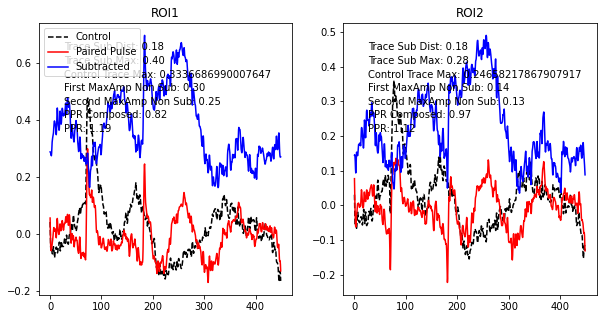

 1/2/2025 1_3 IPI 30ms
 1/2/2025 1_3 IPI 20ms
 1/2/2025 1_3 IPI 120ms
 1/2/2025 1_3 IPI 50ms
 1/2/2025 1_3 IPI 80ms
 1/2/2025 1_3 IPI 100ms
 1/2/2025 1_3 IPI 90ms
 1/2/2025 1_3 IPI 70ms
 1/2/2025 2_2 IPI 110ms


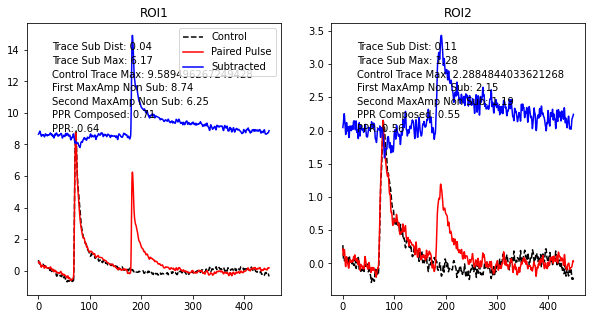

 1/2/2025 2_2 IPI 80ms


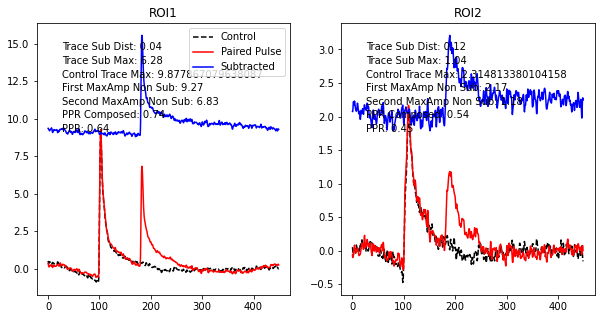

 1/2/2025 2_2 IPI 100ms


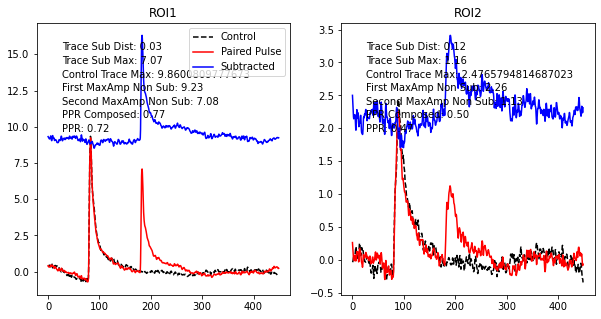

 1/2/2025 2_2 IPI 30ms


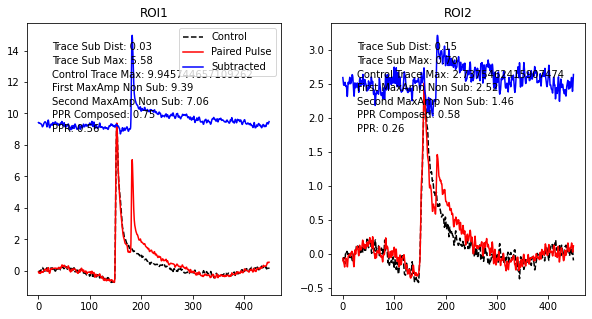

 1/2/2025 2_2 IPI 40ms


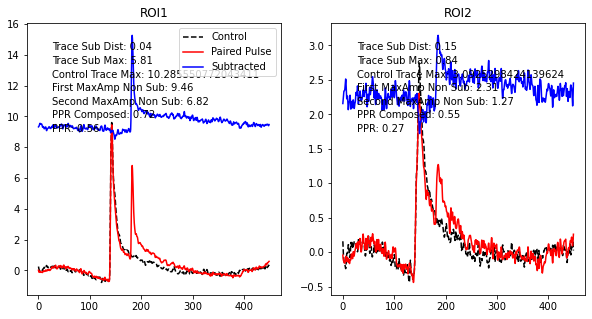

 1/2/2025 2_2 IPI 70ms


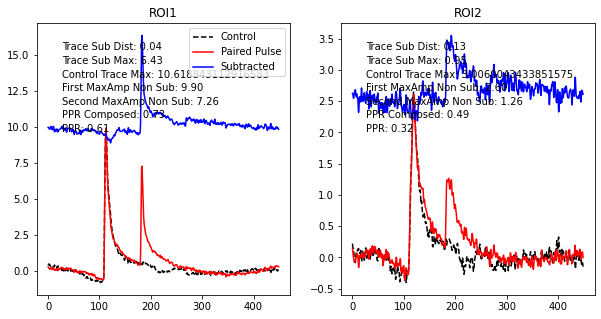

 1/2/2025 2_2 IPI 50ms


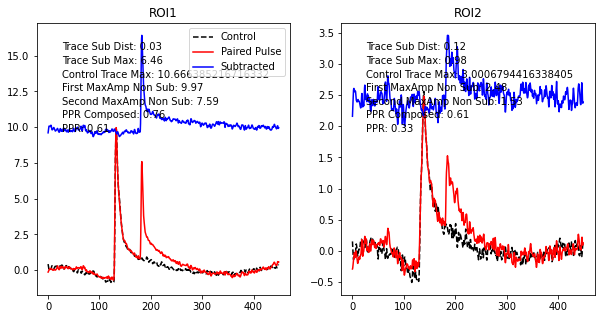

 1/2/2025 2_2 IPI 120ms


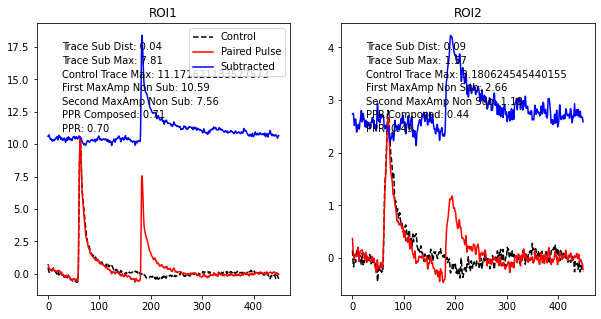

 1/2/2025 2_2 IPI 20ms


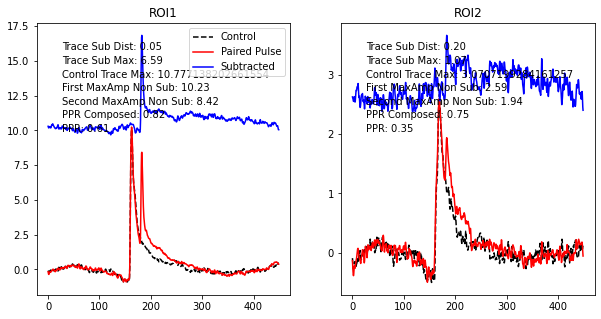

 1/2/2025 2_2 IPI 60ms


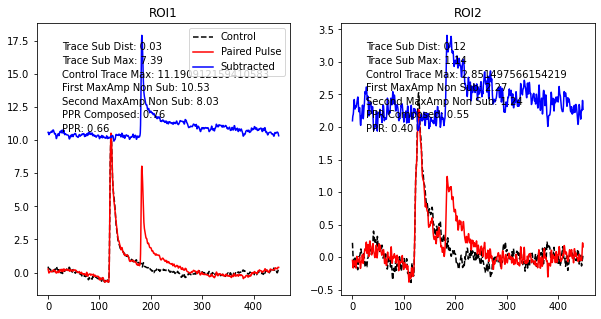

 1/2/2025 2_2 IPI 10ms


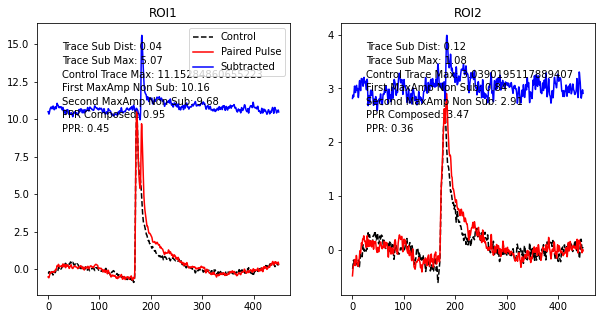

 1/2/2025 2_2 IPI 130ms


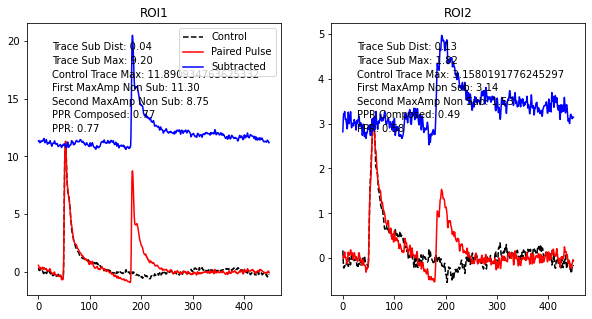

 1/2/2025 2_2 IPI 90ms


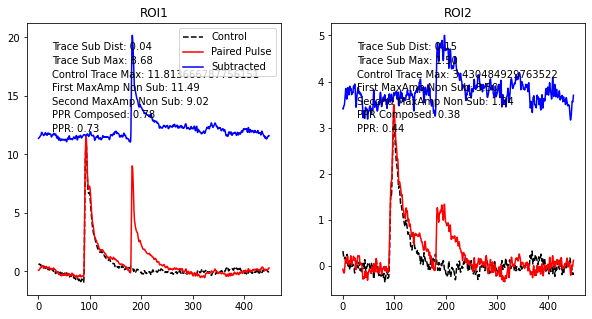

 1/7/2025 1_2 IPI 110ms


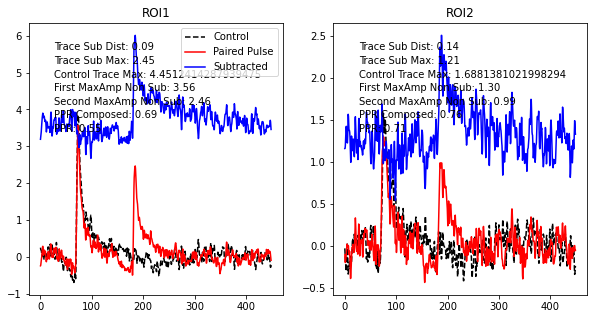

 1/7/2025 1_2 IPI 80ms


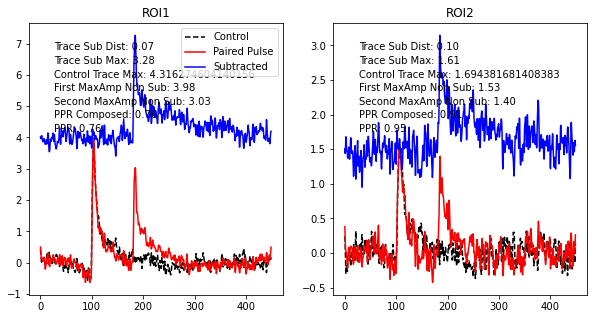

 1/7/2025 1_2 IPI 120ms


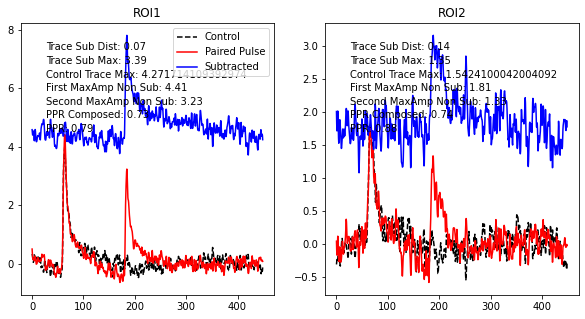

 1/7/2025 1_2 IPI 90ms


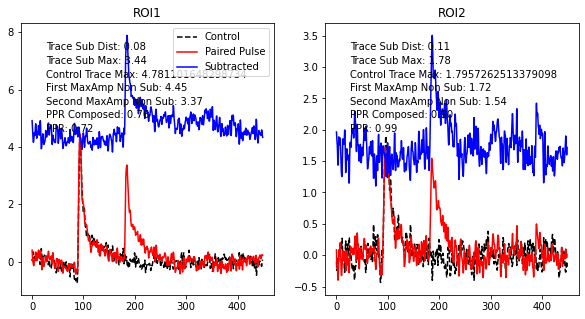

 1/7/2025 1_2 IPI 20ms


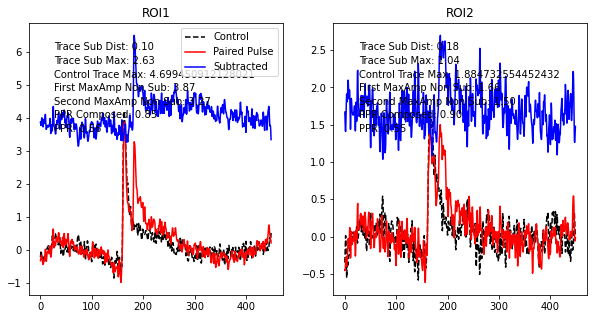

 1/7/2025 1_2 IPI 100ms


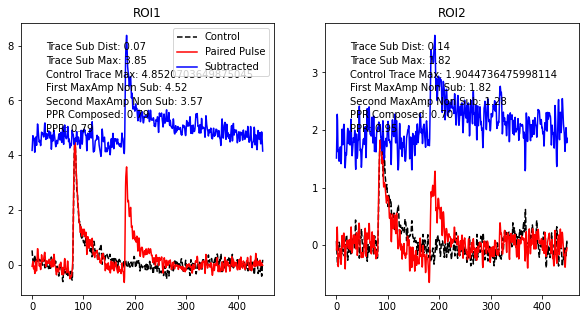

 1/7/2025 1_2 IPI 40ms


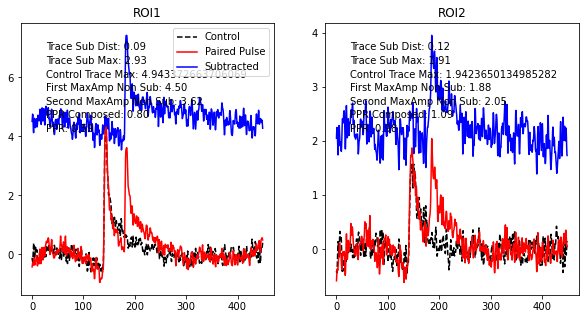

 1/7/2025 1_2 IPI 130ms


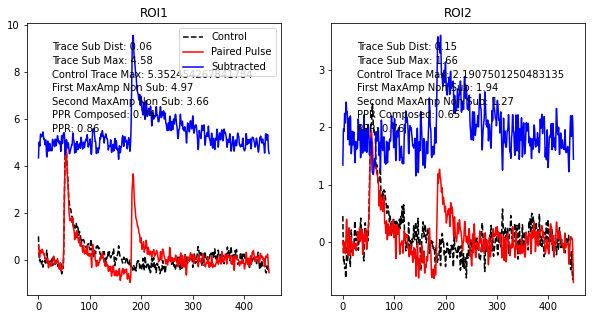

 1/7/2025 1_2 IPI 10ms


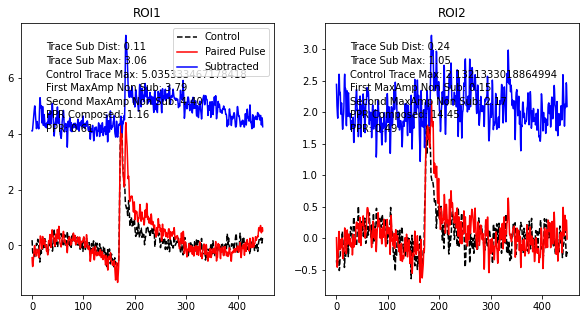

 1/7/2025 1_2 IPI 50ms


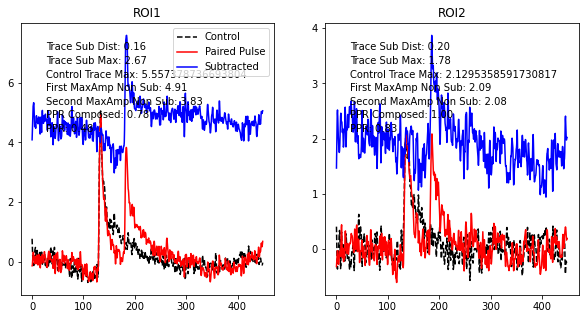

 1/7/2025 1_2 IPI 30ms


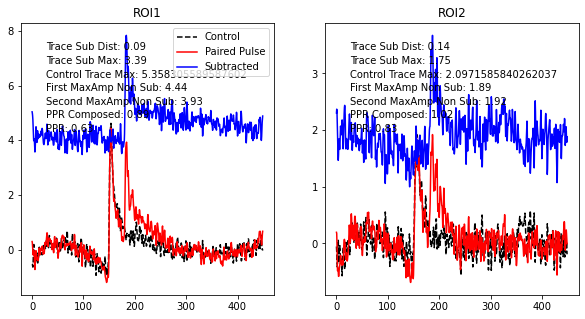

 1/7/2025 1_2 IPI 60ms


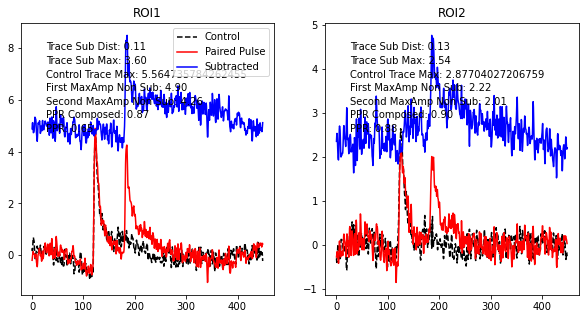

 1/7/2025 1_2 IPI 70ms


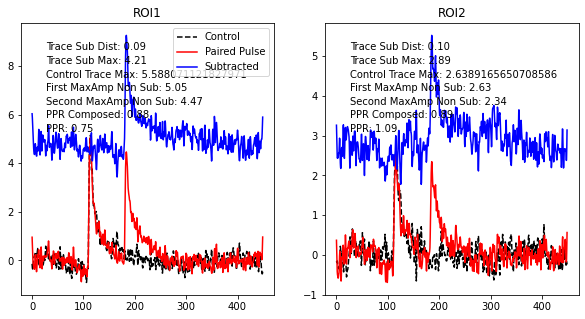

 1/7/2025 2_5 IPI 10ms
 1/7/2025 2_5 IPI 110ms


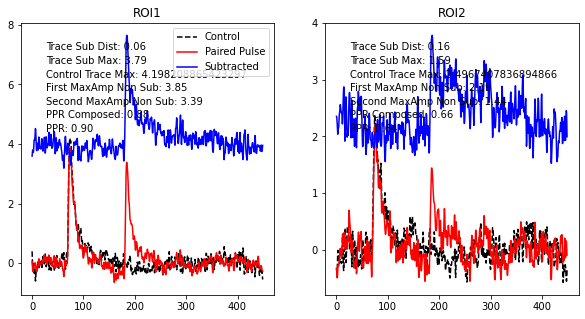

 1/7/2025 2_5 IPI 40ms


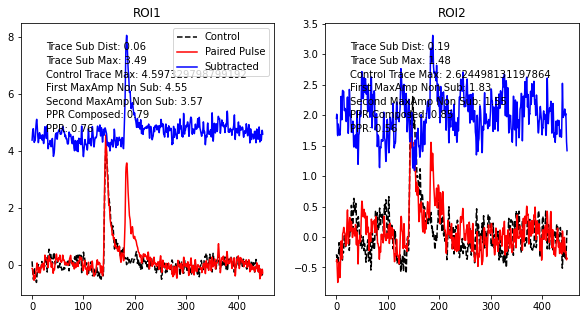

 1/7/2025 2_5 IPI 90ms


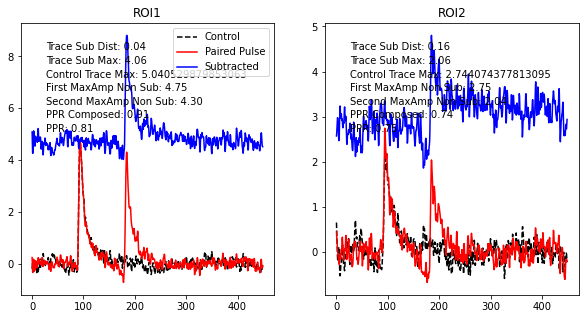

 1/7/2025 2_5 IPI 20ms


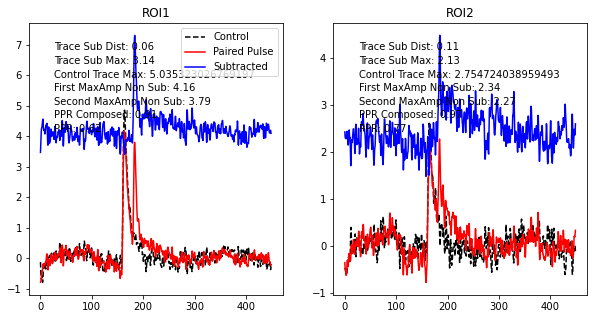

 1/7/2025 2_5 IPI 30ms


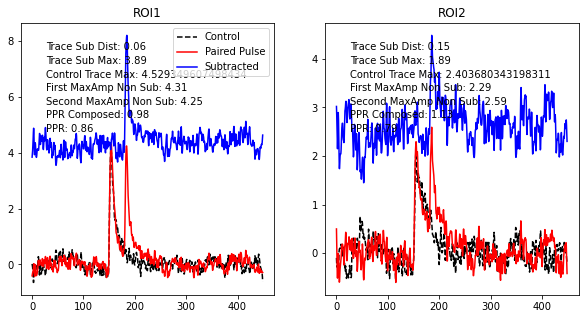

 1/7/2025 2_5 IPI 80ms


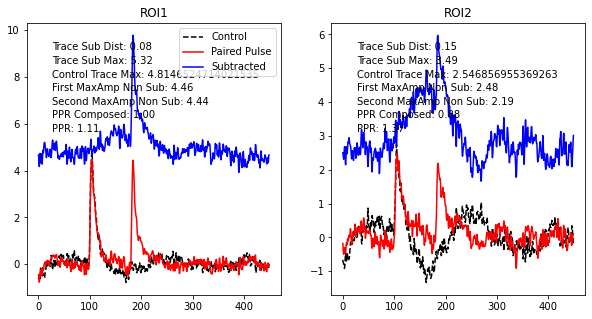

 1/7/2025 2_5 IPI 120ms


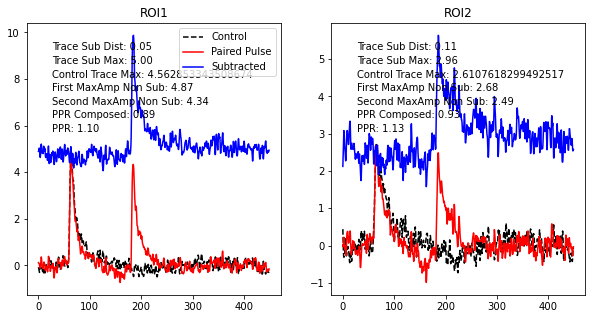

 1/7/2025 2_5 IPI 50ms


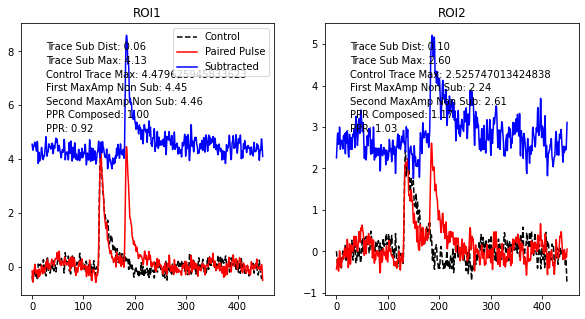

 1/7/2025 2_5 IPI 70ms


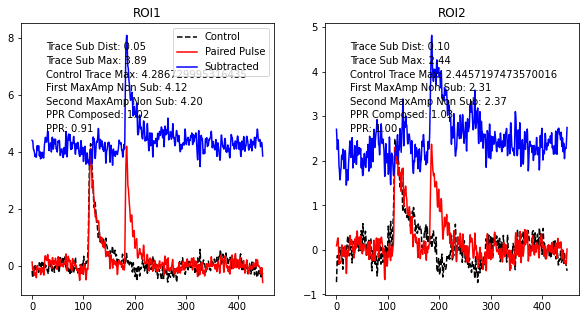

 1/7/2025 2_5 IPI 130ms


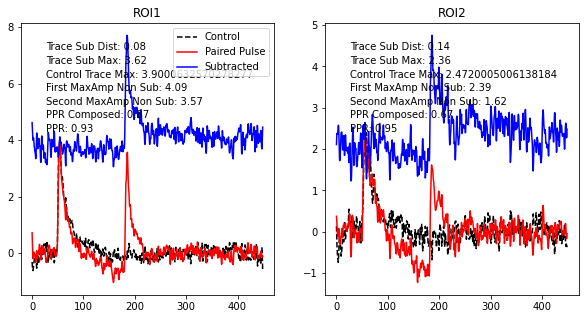

 1/7/2025 2_5 IPI 60ms
 1/7/2025 2_5 IPI 100ms


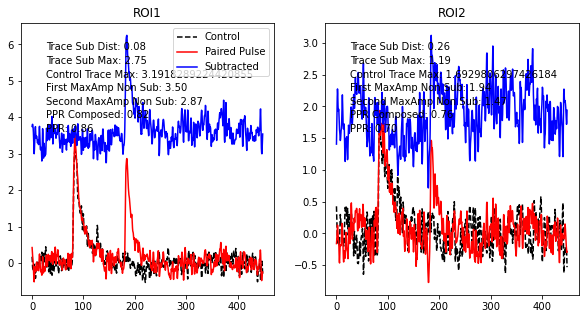

 1/7/2025 3_2 IPI 120ms


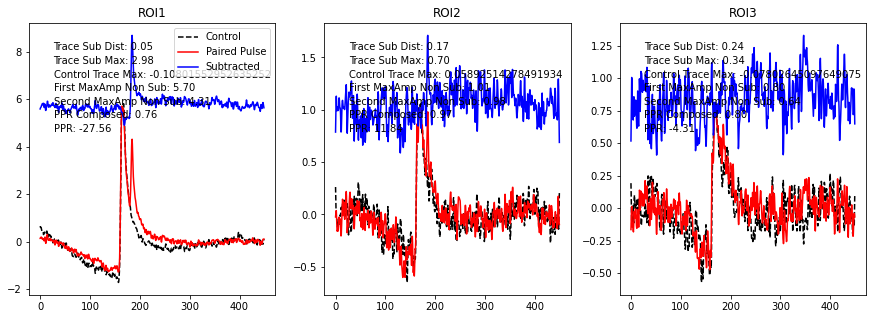

 1/7/2025 3_2 IPI 70ms


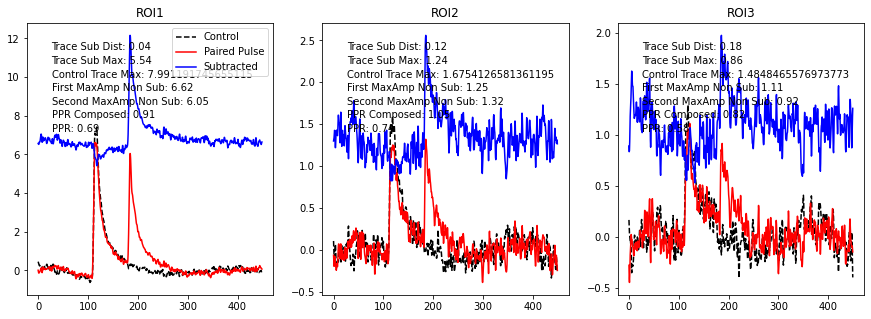

 1/7/2025 3_2 IPI 60ms


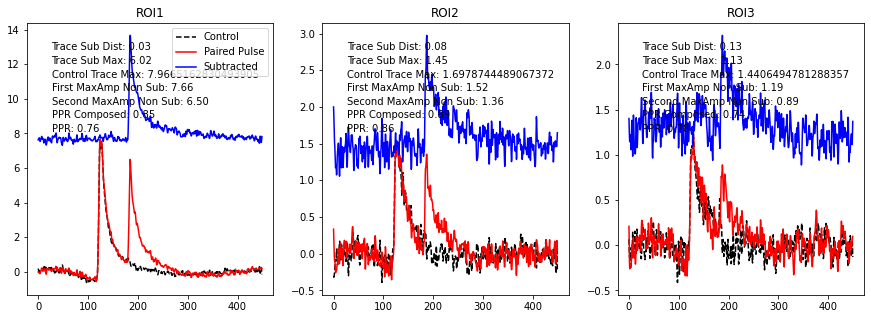

 1/7/2025 3_2 IPI 110ms


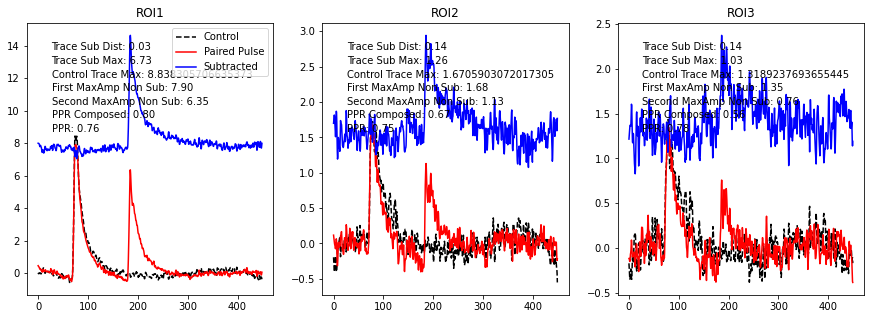

 1/7/2025 3_2 IPI 40ms


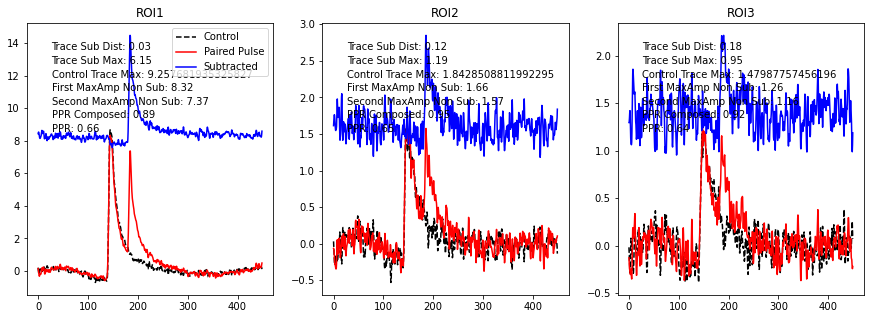

 1/7/2025 3_2 IPI 100ms


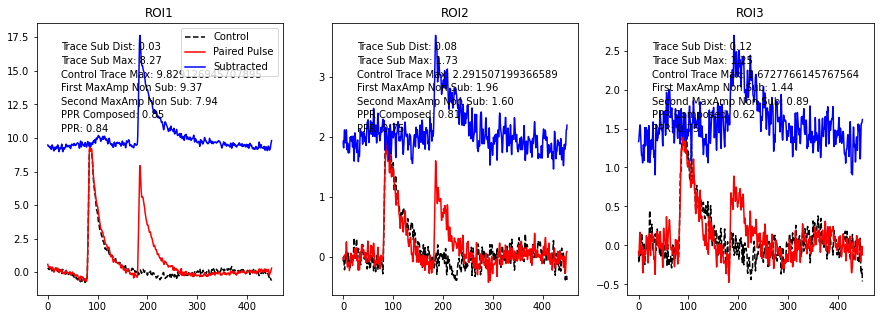

 1/7/2025 3_2 IPI 50ms


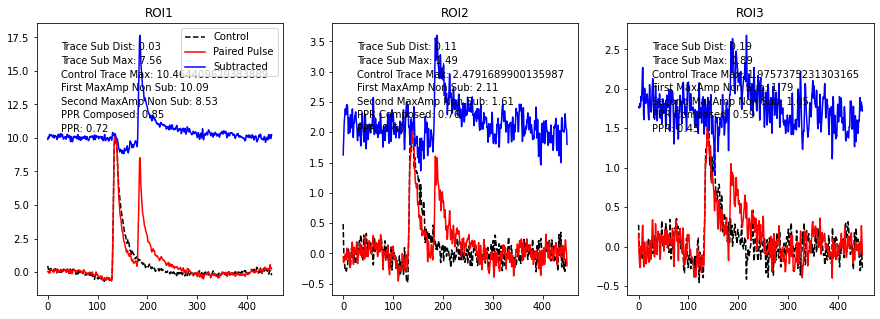

 1/7/2025 3_2 IPI 130ms


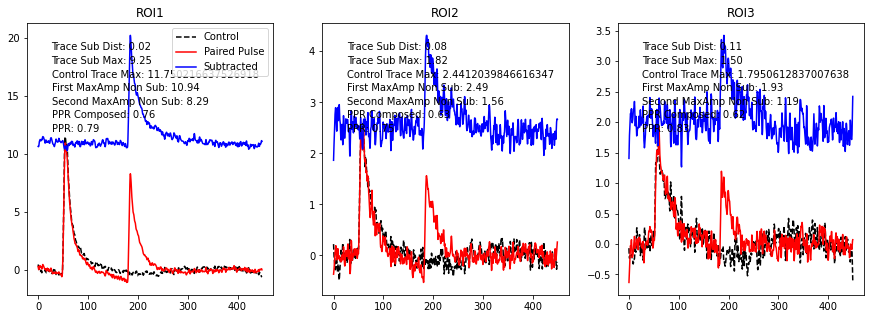

 1/7/2025 3_2 IPI 80ms


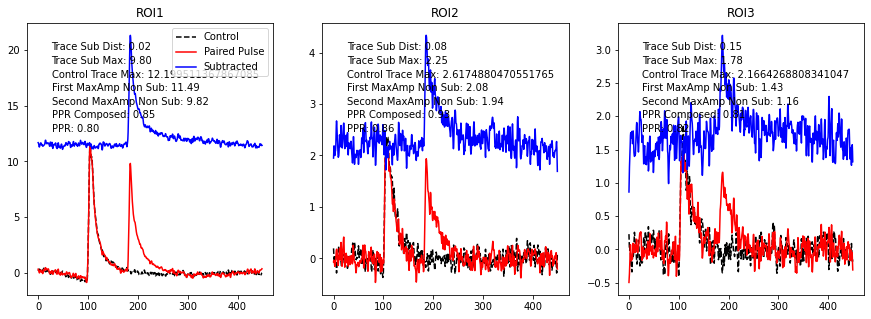

 1/7/2025 3_2 IPI 30ms


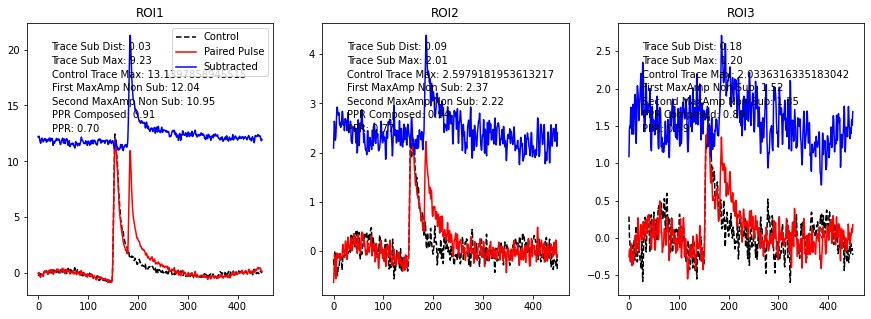

 1/7/2025 3_2 IPI 10ms


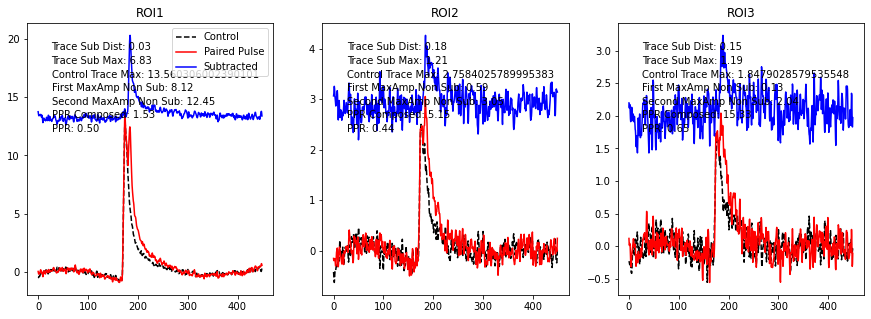

 1/7/2025 4_2 IPI 110ms


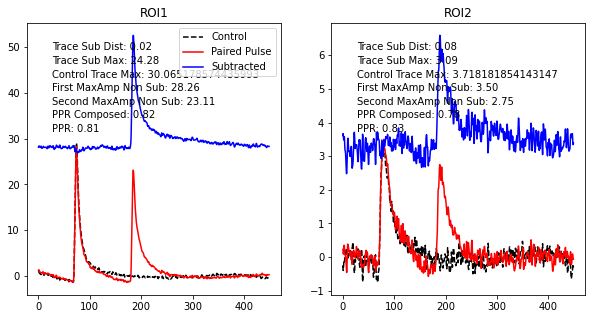

 1/7/2025 4_2 IPI 50ms


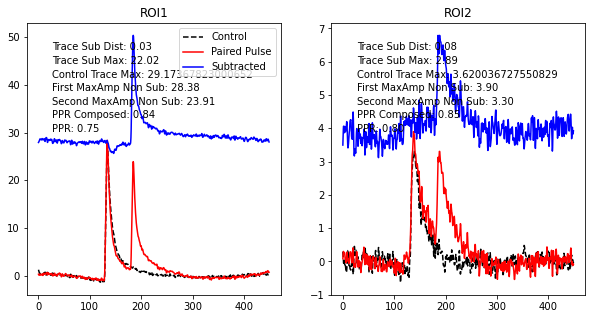

 1/7/2025 4_2 IPI 60ms


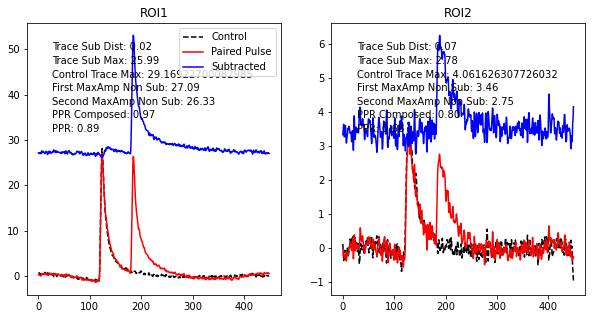

 1/7/2025 4_2 IPI 130ms


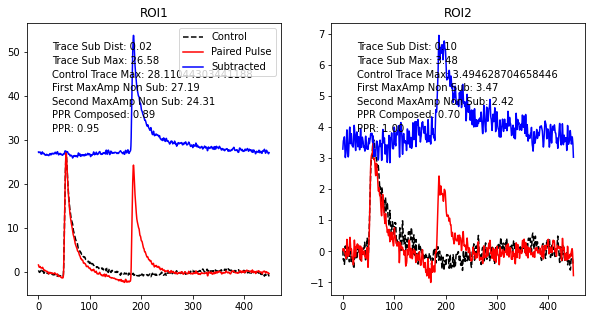

 1/7/2025 4_2 IPI 80ms


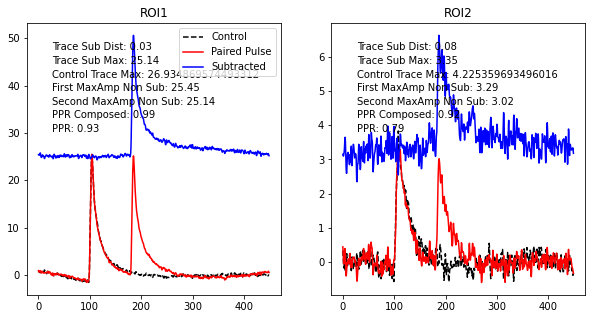

 1/7/2025 4_2 IPI 90ms


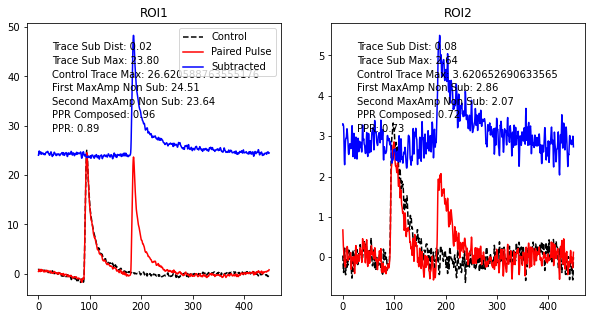

 1/7/2025 4_2 IPI 40ms


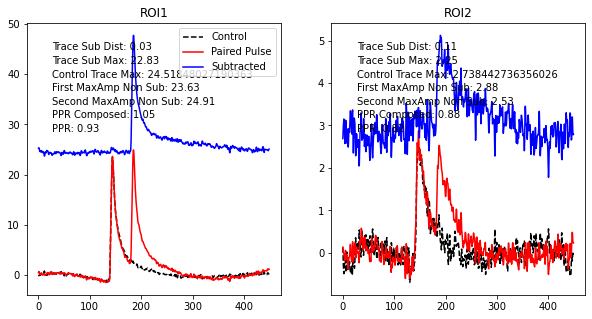

 1/7/2025 4_2 IPI 100ms


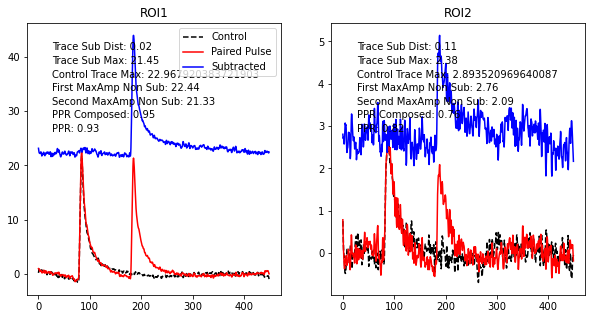

 1/7/2025 4_2 IPI 10ms


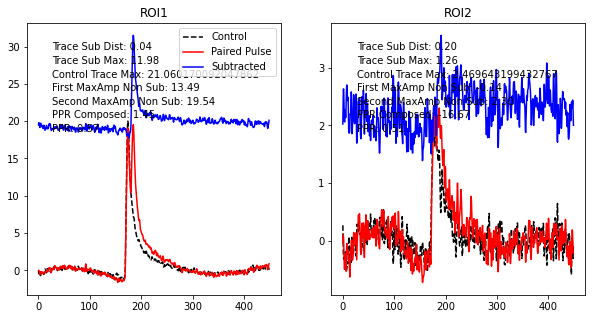

 1/7/2025 4_2 IPI 120ms


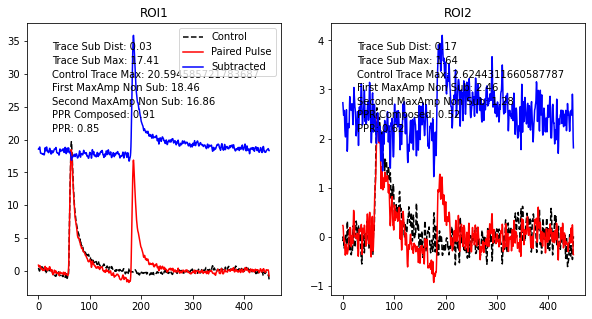

 1/7/2025 4_2 IPI 30ms


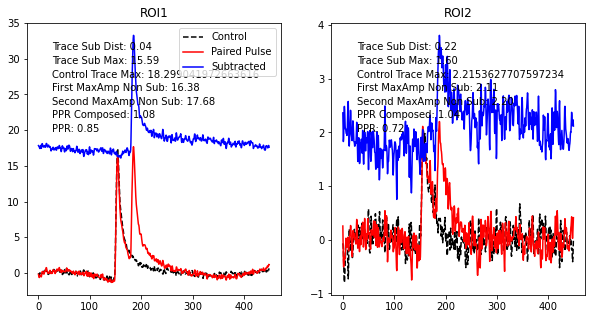

 1/7/2025 4_2 IPI 70ms


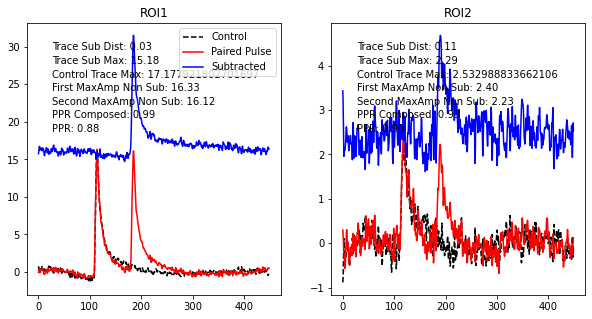

 1/7/2025 4_2 IPI 20ms


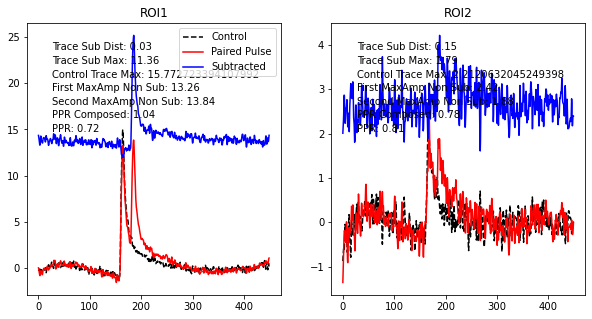

 11/6/2024 2_1 IPI 70ms


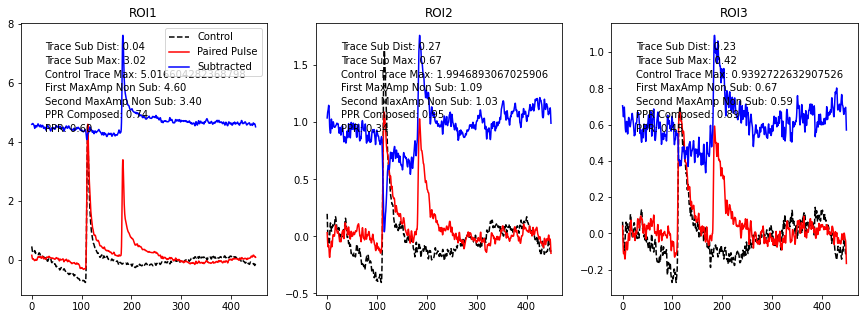

 11/6/2024 2_1 IPI 20ms


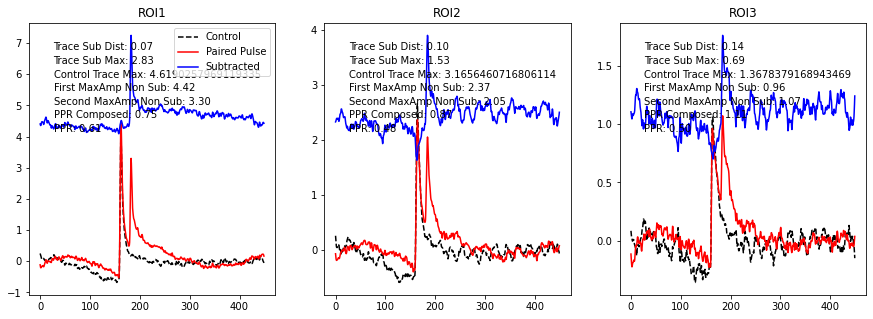

 11/6/2024 2_1 IPI 120ms


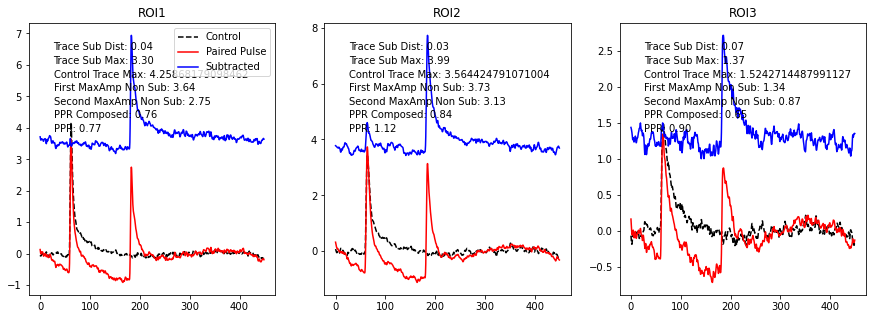

 12/11/2024 1_3 IPI 70ms


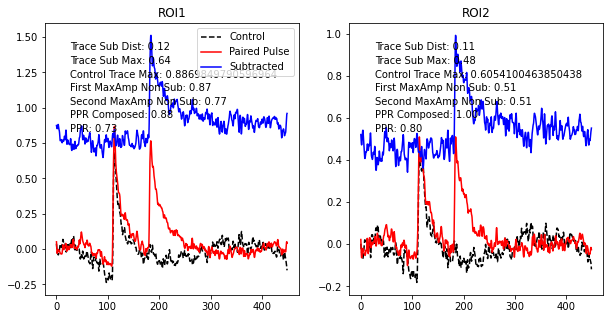

 12/11/2024 1_3 IPI 20ms


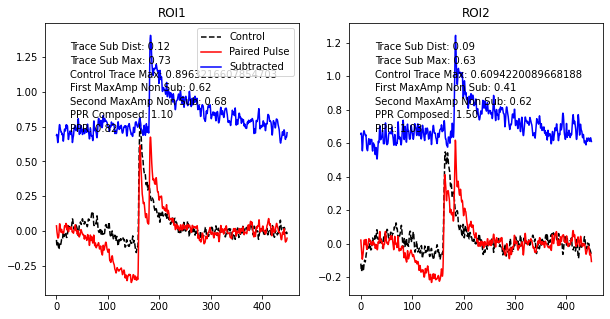

 12/11/2024 1_3 IPI 120ms


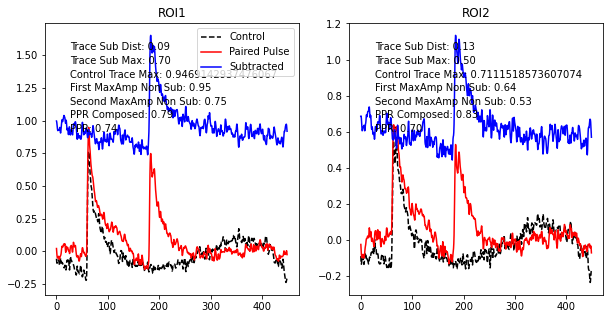

 12/11/2024 2_2 IPI 20ms


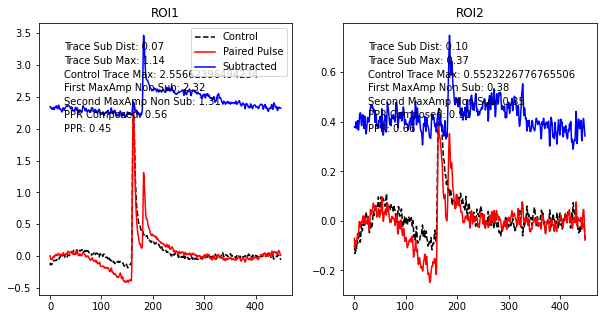

 12/11/2024 2_2 IPI 70ms


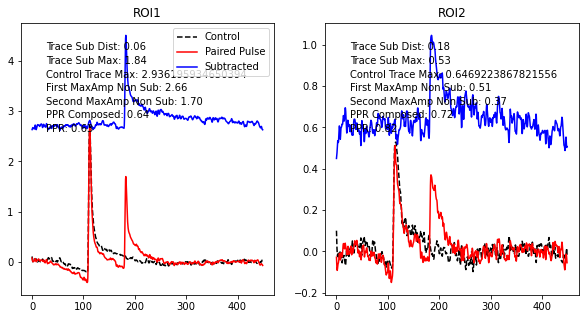

 12/11/2024 2_2 IPI 120ms


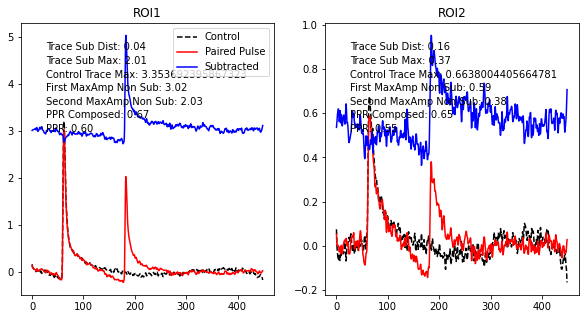

 12/11/2024 3_3 IPI 120ms


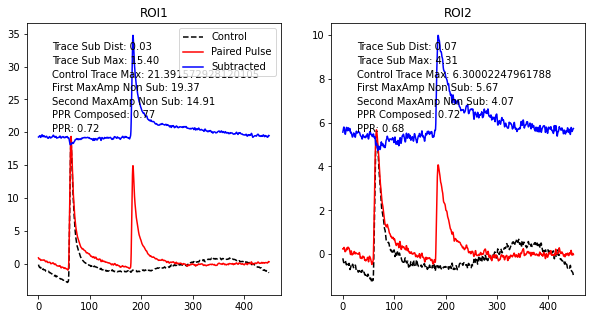

 12/11/2024 3_3 IPI 20ms


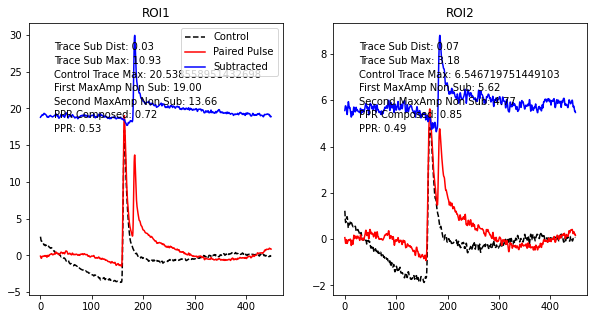

 12/11/2024 3_3 IPI 70ms


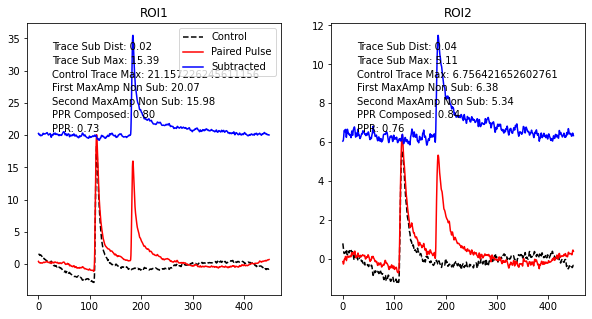

 12/18/2024 1_2 IPI 50ms


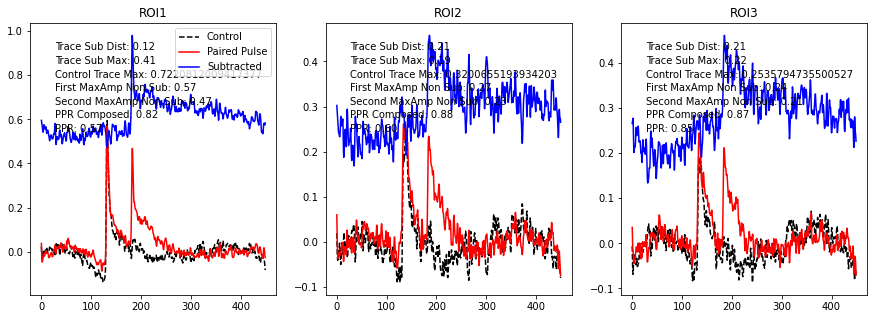

 12/18/2024 1_2 IPI 20ms


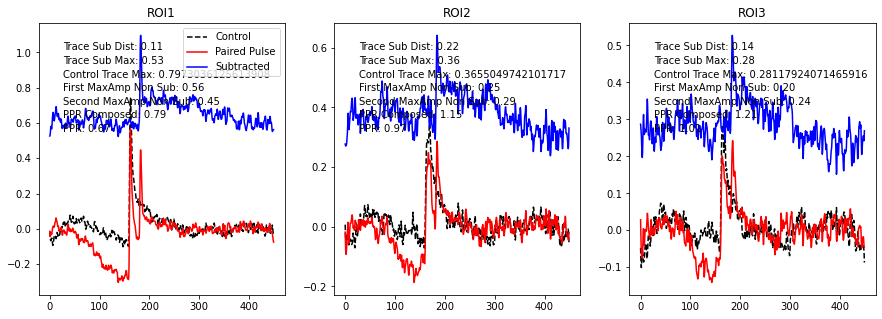

 12/18/2024 1_2 IPI 130ms


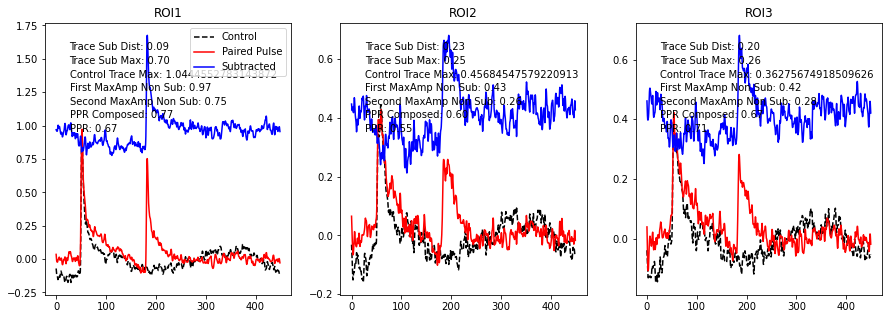

 12/18/2024 1_2 IPI 70ms


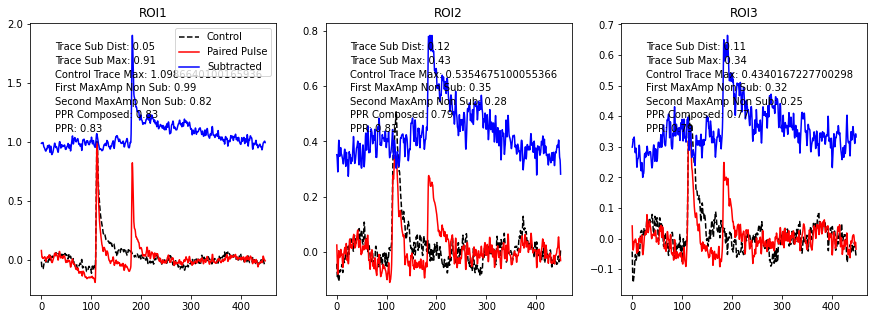

 12/18/2024 1_2 IPI 60ms


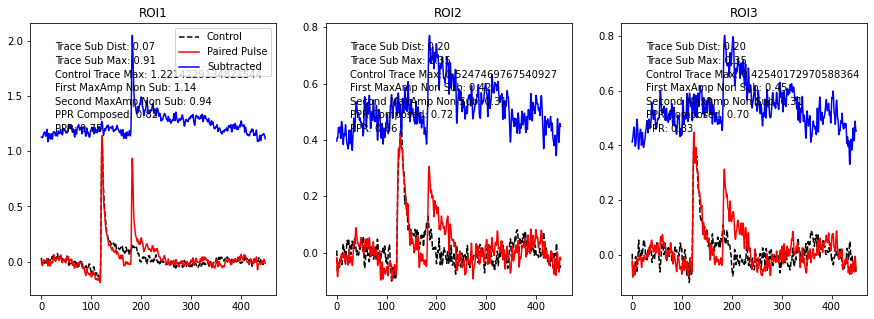

 12/18/2024 1_2 IPI 90ms


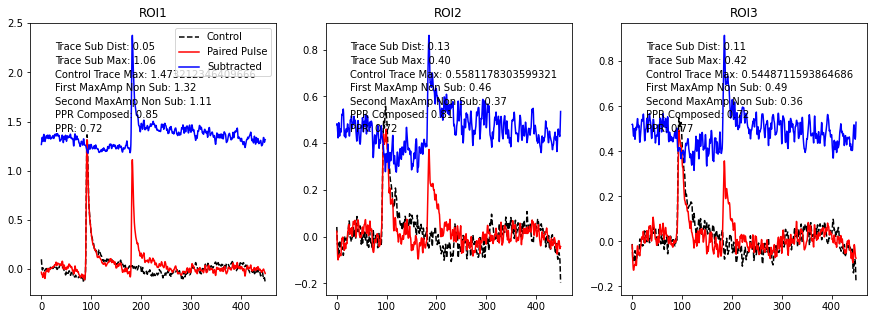

 12/18/2024 1_2 IPI 100ms


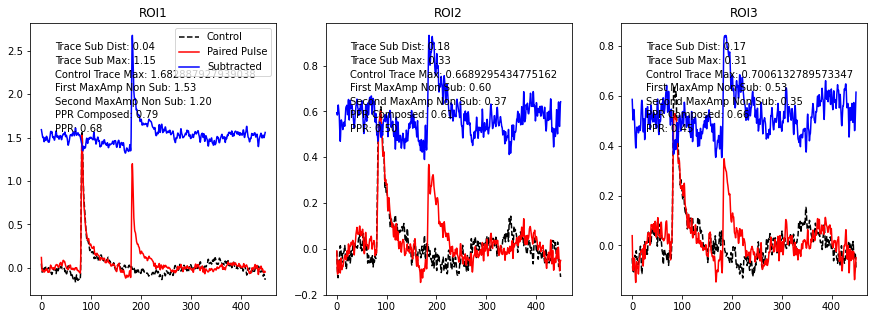

 12/18/2024 1_2 IPI 120ms


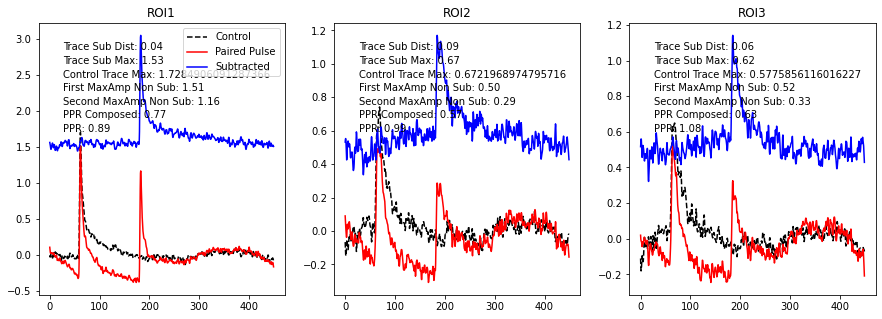

 12/18/2024 1_2 IPI 80ms


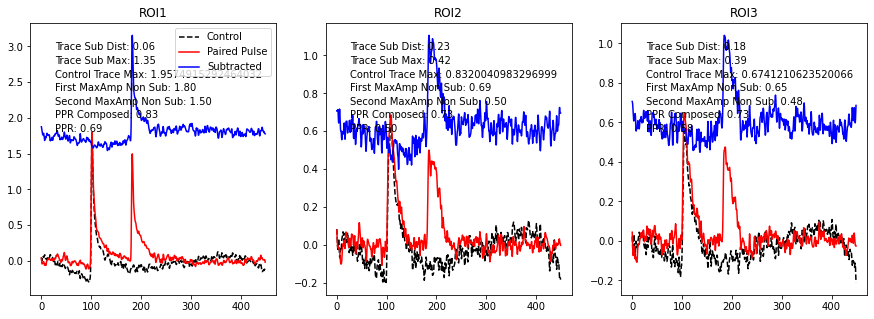

 12/18/2024 1_2 IPI 40ms


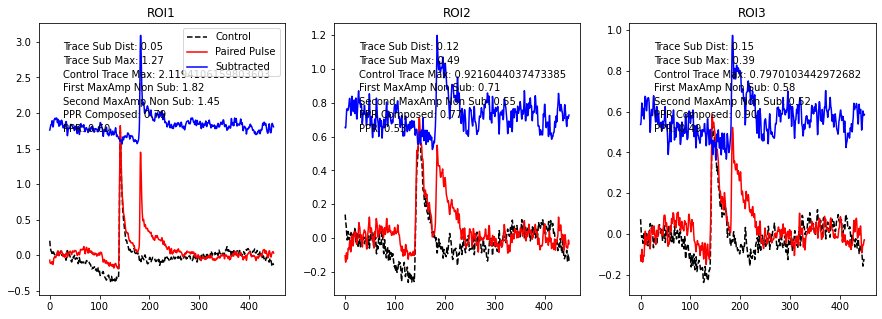

 12/18/2024 1_2 IPI 110ms


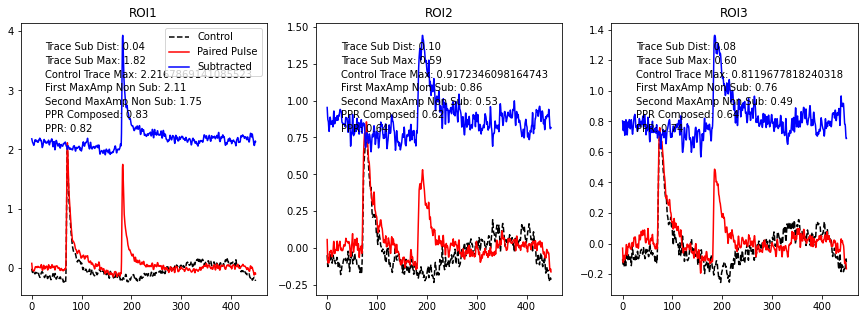

 12/18/2024 1_2 IPI 30ms
 12/18/2024 1_2 IPI 10ms
 12/18/2024 2_2 IPI 70ms


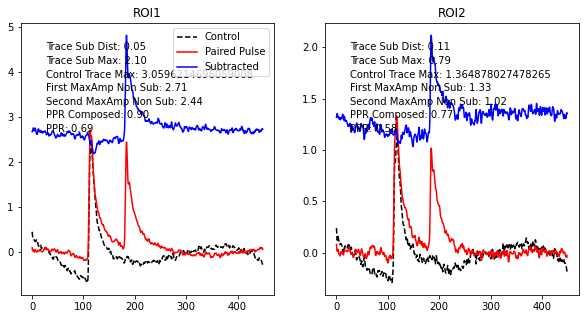

 12/18/2024 2_2 IPI 20ms


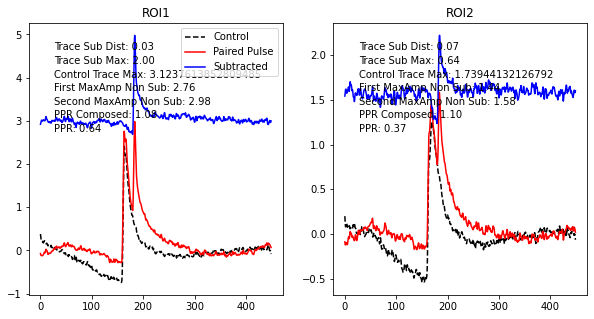

 12/18/2024 2_2 IPI 120ms


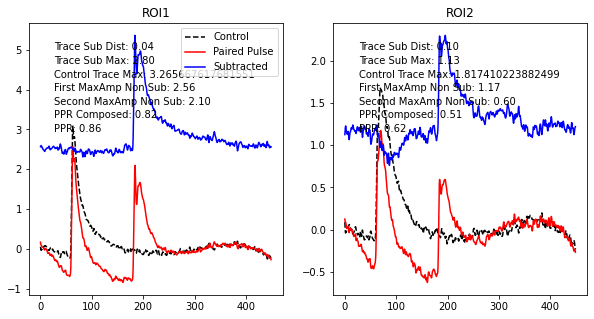

 12/18/2024 2_2 IPI 50ms


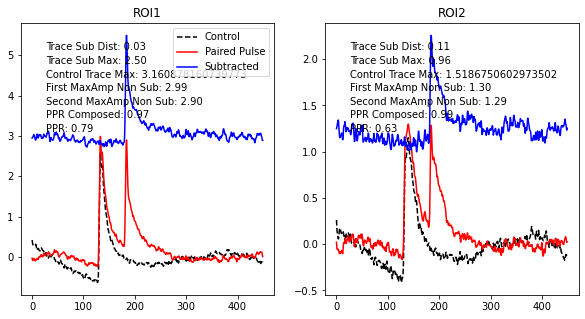

 12/18/2024 2_2 IPI 10ms


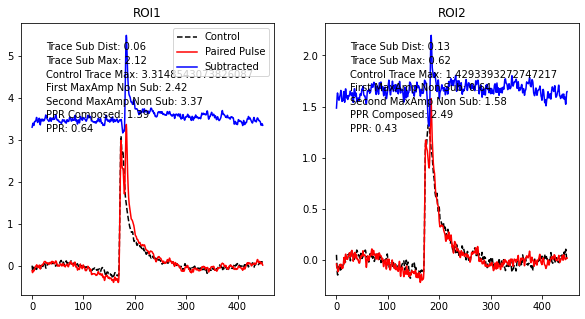

 12/18/2024 2_2 IPI 40ms


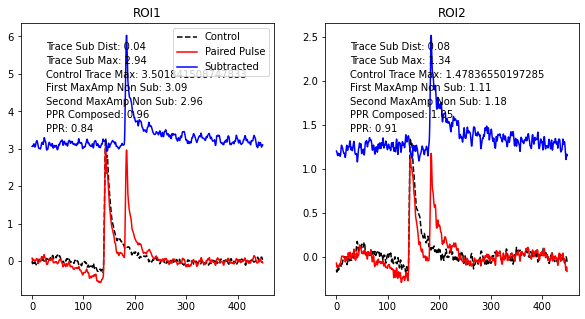

 12/18/2024 2_2 IPI 100ms


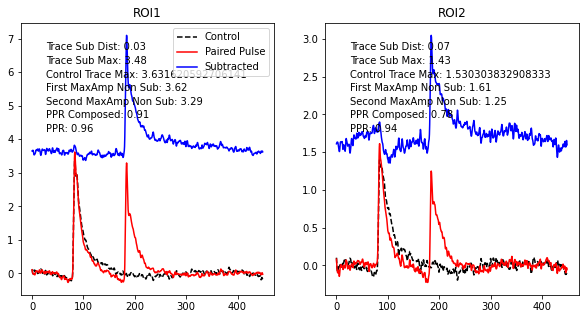

 12/18/2024 2_2 IPI 110ms


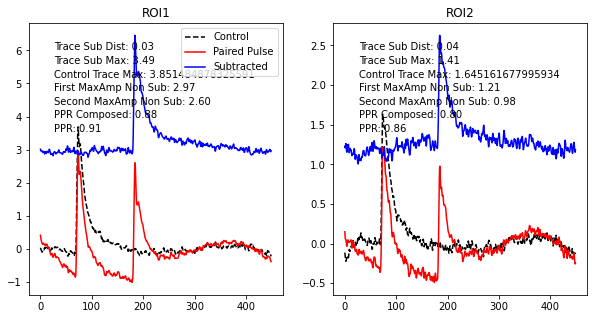

 12/18/2024 2_2 IPI 60ms


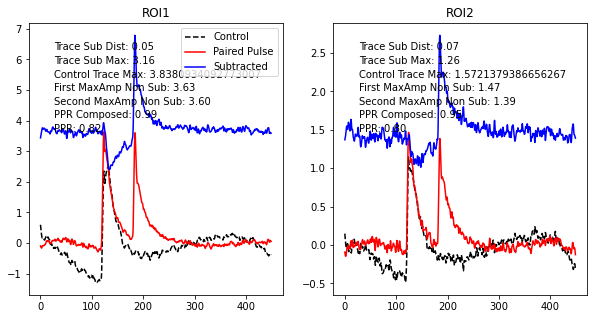

 12/18/2024 2_2 IPI 130ms
 12/18/2024 2_2 IPI 90ms
 12/18/2024 2_2 IPI 30ms


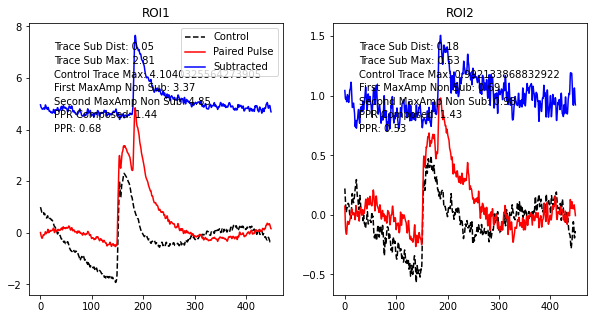

 12/18/2024 2_2 IPI 80ms


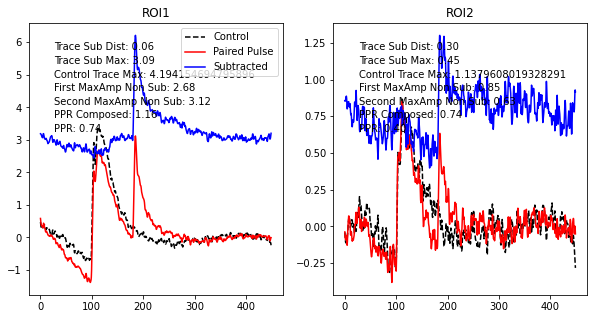

 12/20/2024 1_2 IPI 130ms


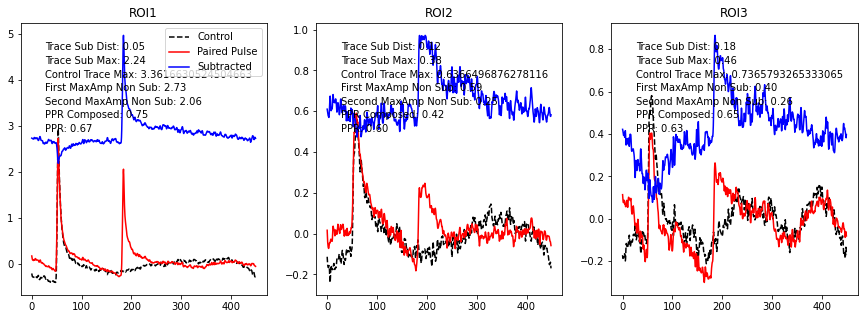

 12/20/2024 1_2 IPI 90ms


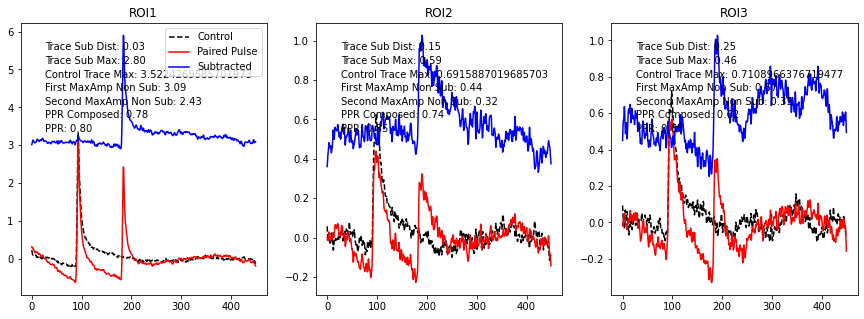

 12/20/2024 1_2 IPI 70ms
 12/20/2024 1_2 IPI 10ms
 12/20/2024 1_2 IPI 110ms


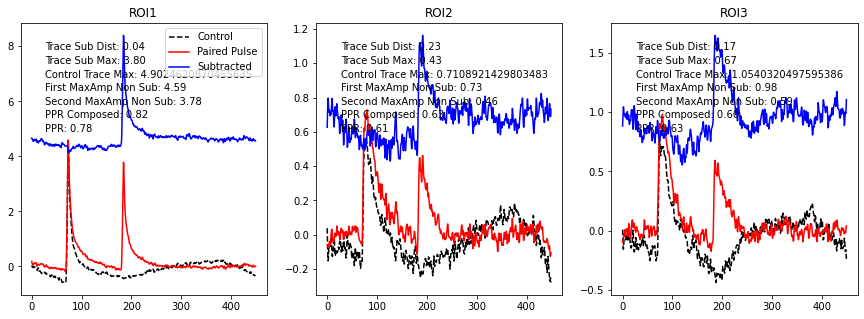

 12/20/2024 1_2 IPI 30ms


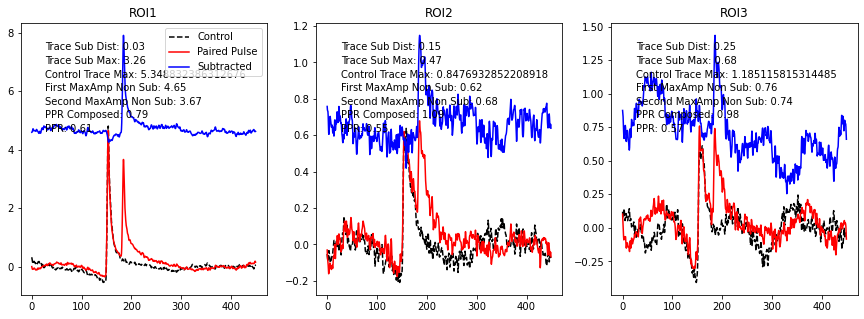

 12/20/2024 1_2 IPI 60ms
 12/20/2024 1_2 IPI 40ms
 12/20/2024 1_2 IPI 20ms
 12/20/2024 1_2 IPI 50ms


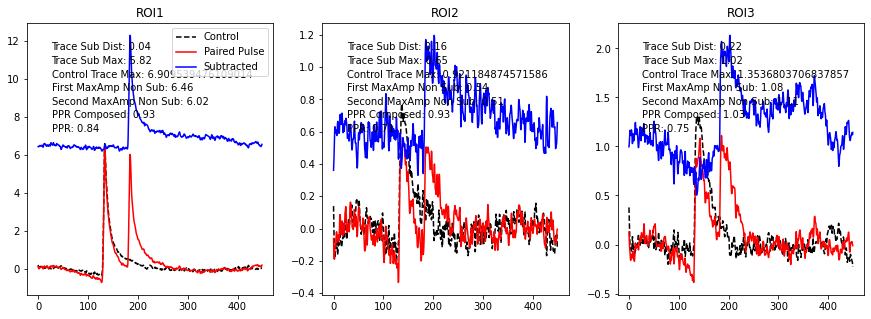

 12/20/2024 1_2 IPI 80ms
 12/20/2024 1_2 IPI 100ms


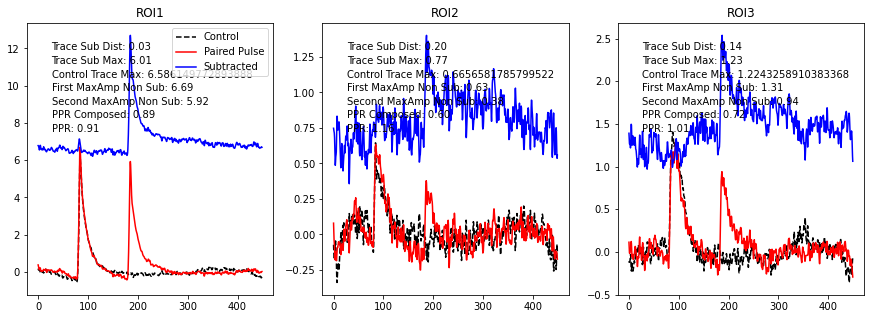

 12/20/2024 1_2 IPI 120ms


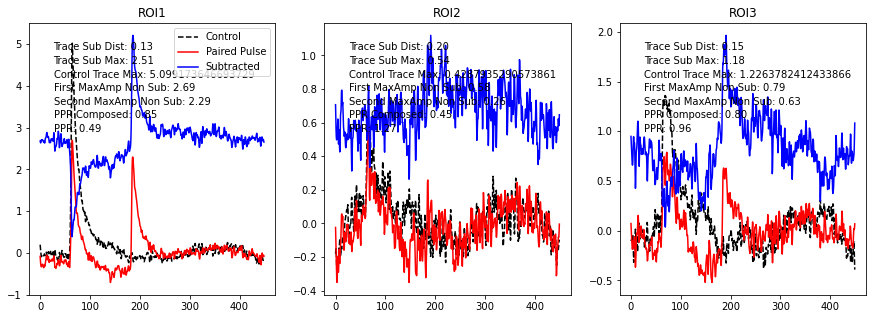

 12/20/2024 2_2 IPI 30ms


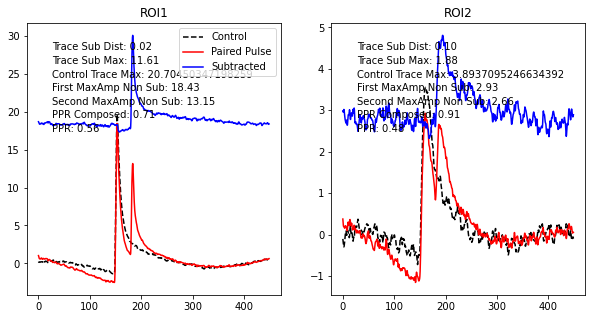

 12/20/2024 2_2 IPI 90ms


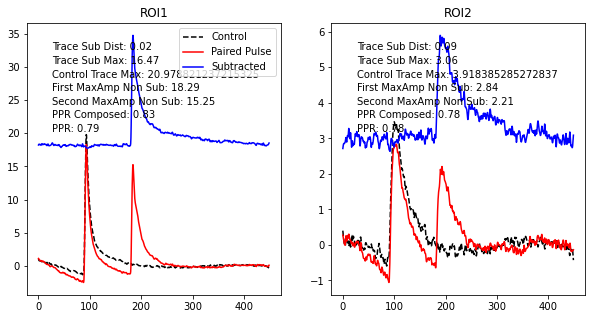

 12/20/2024 2_2 IPI 130ms


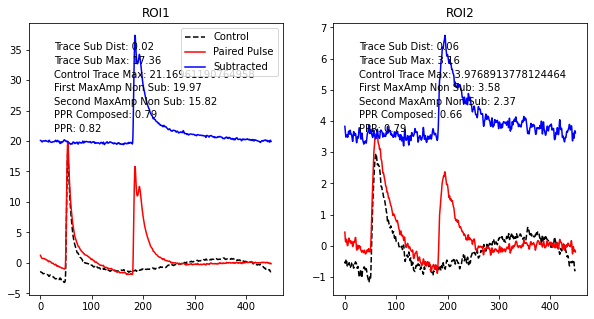

 12/20/2024 2_2 IPI 20ms


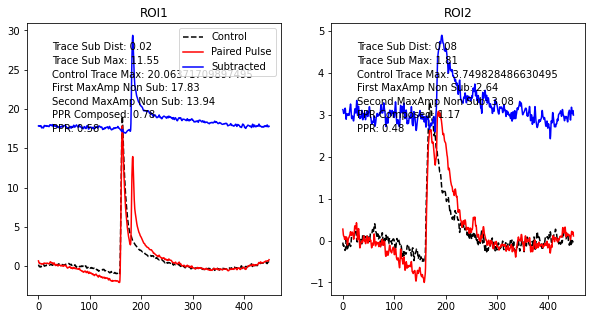

 12/20/2024 2_2 IPI 70ms


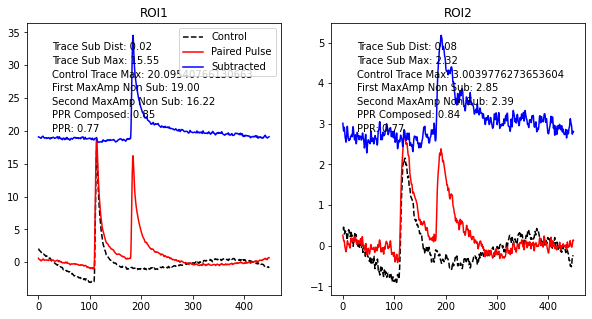

 12/20/2024 2_2 IPI 10ms


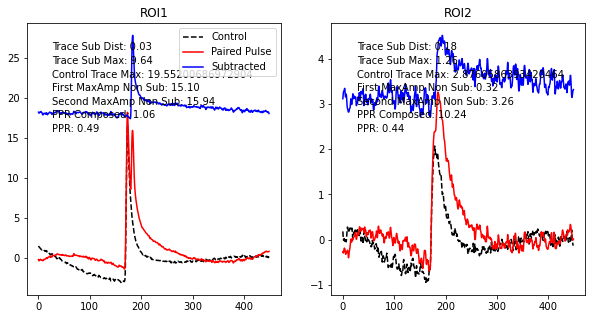

 12/20/2024 2_2 IPI 100ms


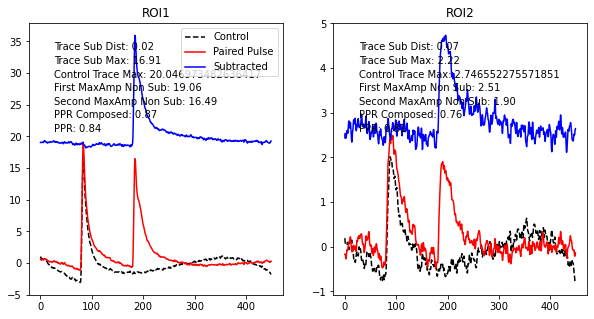

 12/20/2024 2_2 IPI 40ms


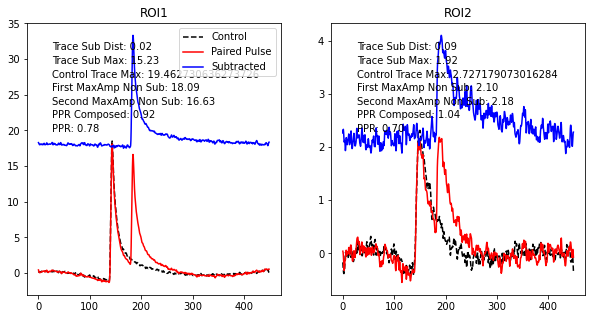

 12/20/2024 2_2 IPI 60ms


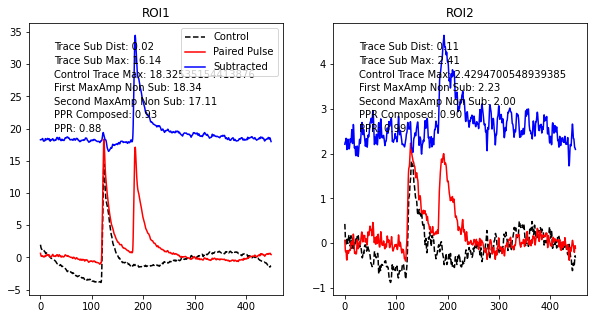

 12/20/2024 2_2 IPI 120ms


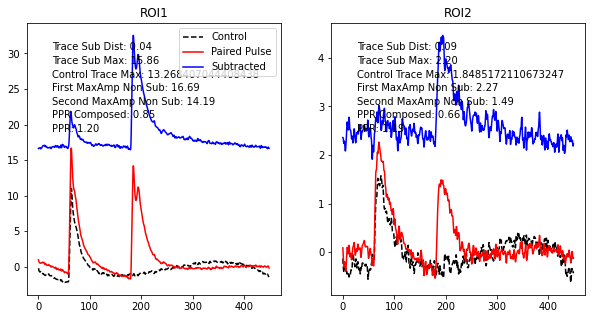

 12/20/2024 2_2 IPI 80ms


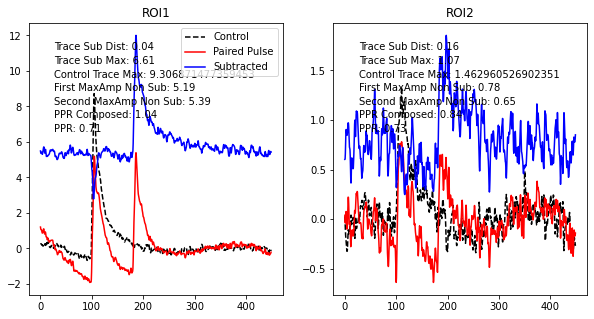

 12/20/2024 2_2 IPI 50ms


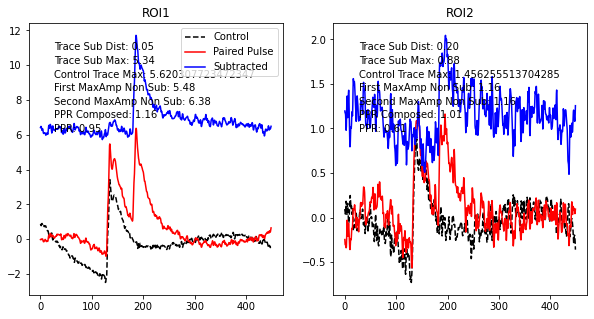

 12/20/2024 2_2 IPI 110ms


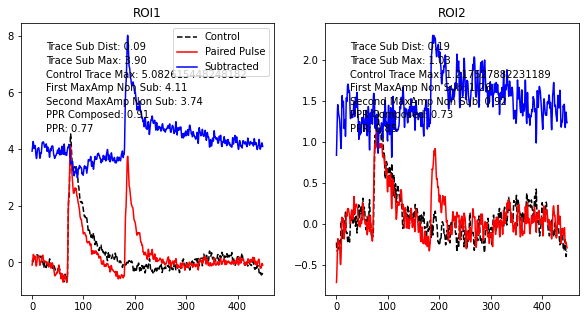

 12/23/2024 1_3 IPI 130ms


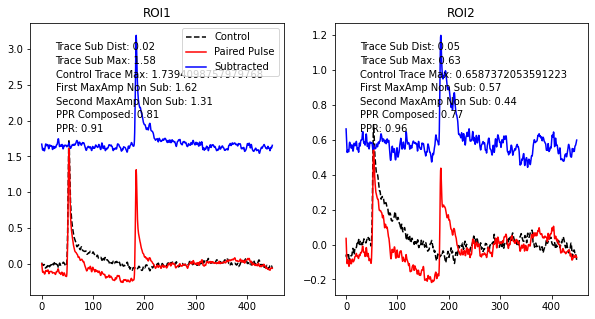

 12/23/2024 1_3 IPI 50ms


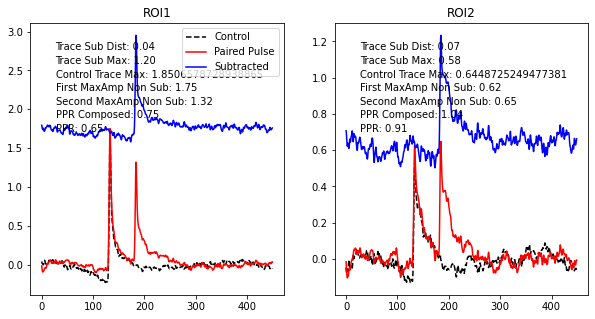

 12/23/2024 1_3 IPI 30ms


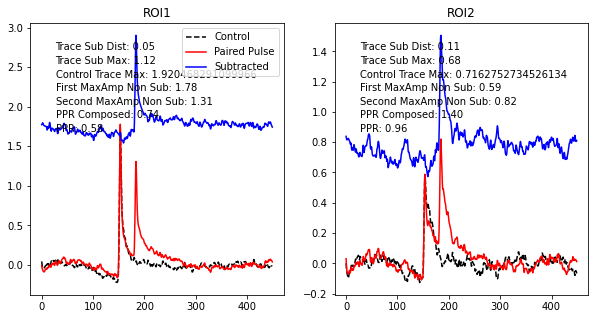

 12/23/2024 1_3 IPI 20ms


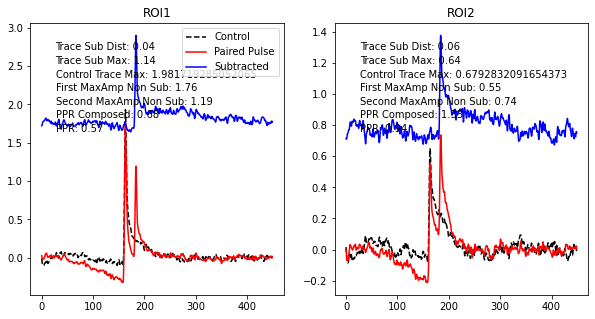

 12/23/2024 1_3 IPI 110ms


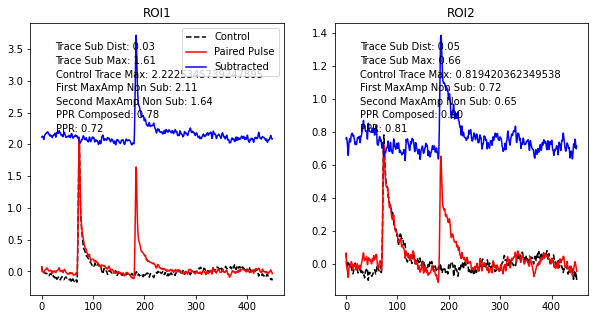

 12/23/2024 1_3 IPI 100ms


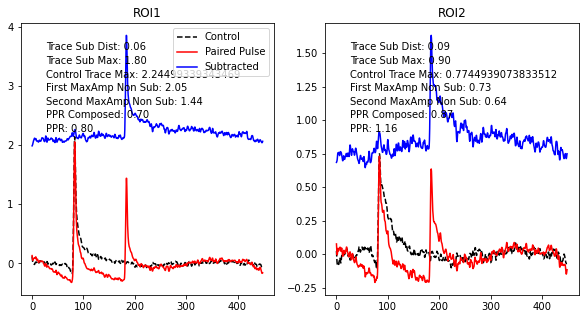

 12/23/2024 1_3 IPI 60ms


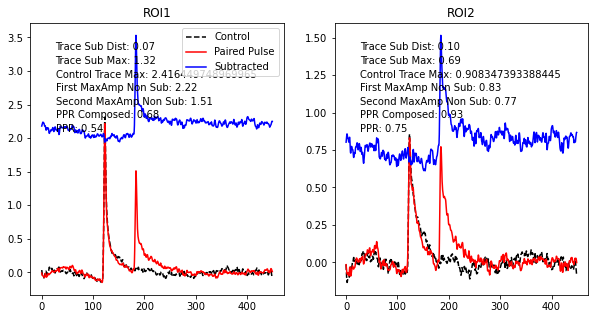

 12/23/2024 1_3 IPI 70ms


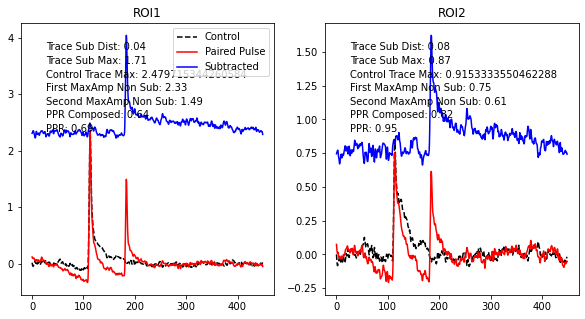

 12/23/2024 1_3 IPI 10ms


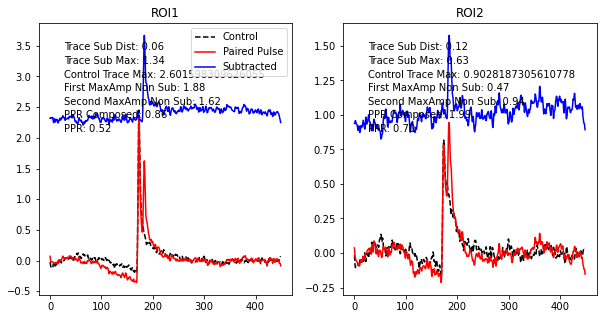

 12/23/2024 1_3 IPI 80ms


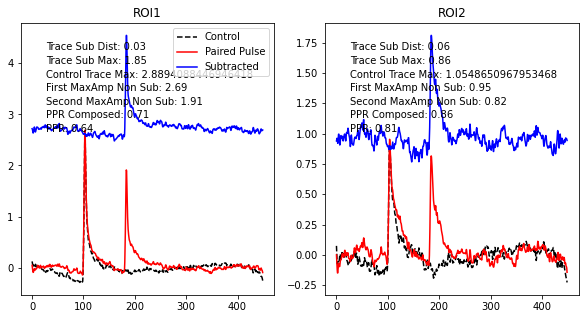

 12/23/2024 1_3 IPI 120ms


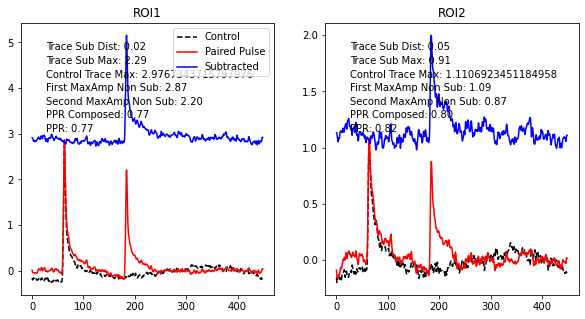

 12/23/2024 1_3 IPI 90ms


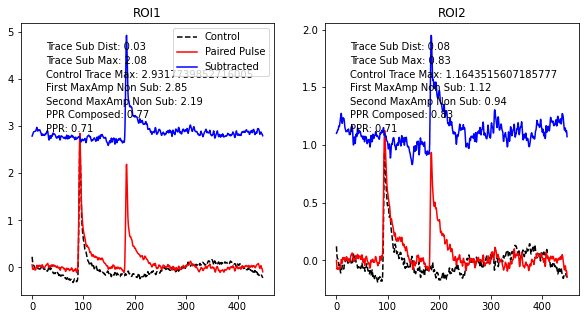

 12/23/2024 1_3 IPI 40ms


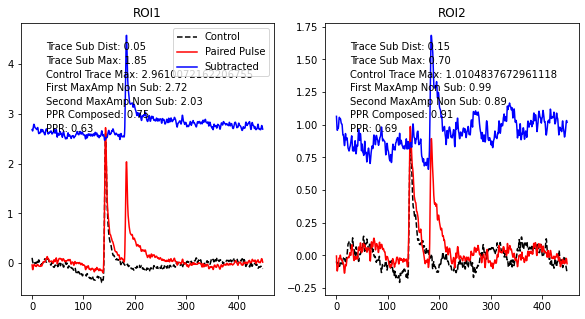

 12/23/2024 2_2 IPI 130ms


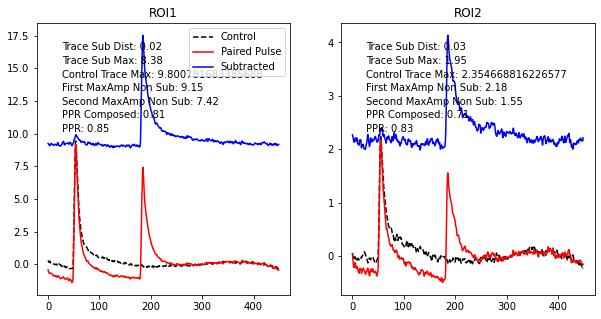

 12/23/2024 2_2 IPI 30ms


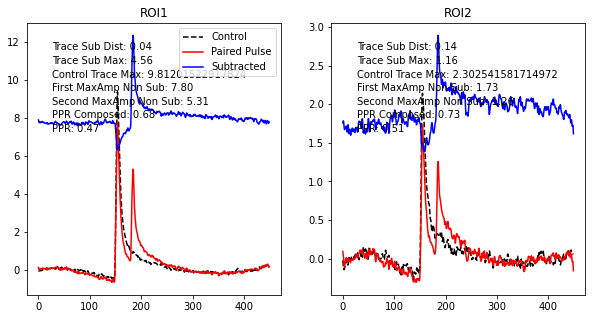

 12/23/2024 2_2 IPI 60ms


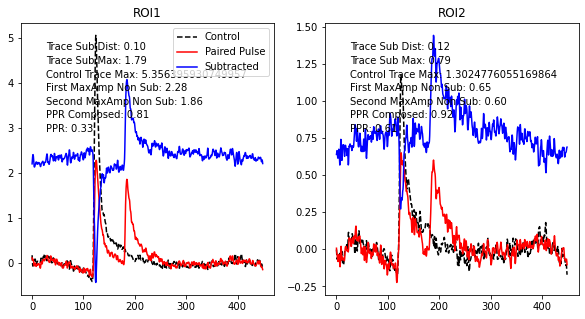

 12/23/2024 2_2 IPI 90ms


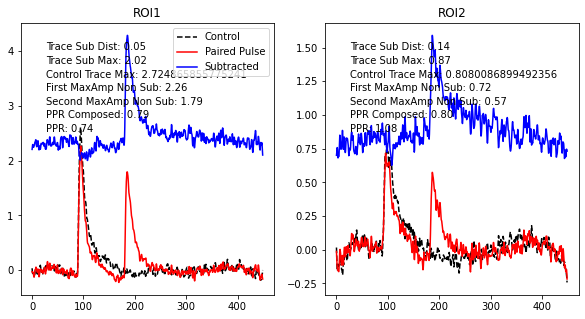

 12/23/2024 2_2 IPI 110ms


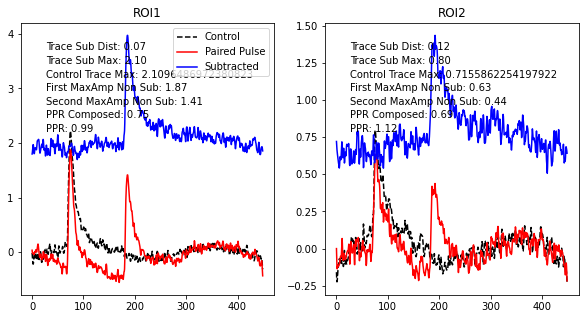

 12/23/2024 2_2 IPI 100ms


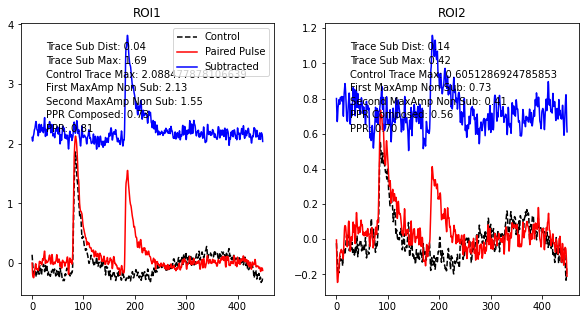

 12/23/2024 2_2 IPI 70ms
 12/23/2024 2_2 IPI 120ms


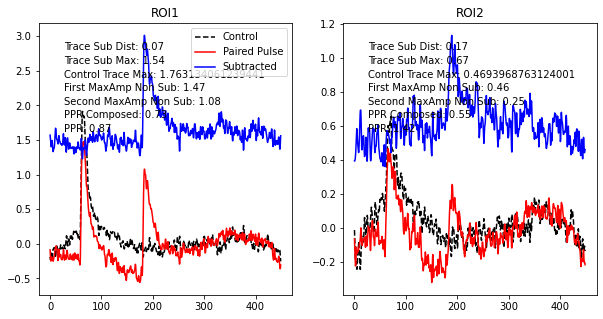

 12/23/2024 2_2 IPI 40ms


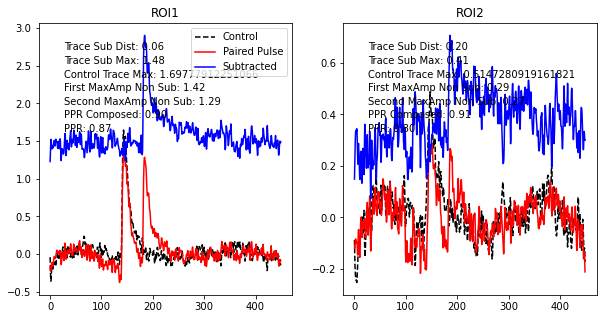

 12/23/2024 2_2 IPI 80ms
 12/23/2024 2_2 IPI 20ms
 12/23/2024 2_2 IPI 50ms


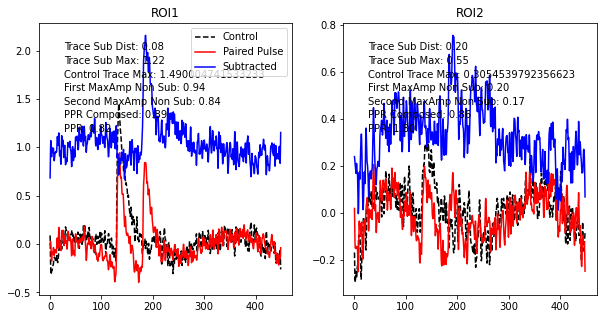

 12/23/2024 2_2 IPI 10ms


In [7]:
for date in ppr_coronal_df['Date'].unique():
    date_df = ppr_coronal_df[ppr_coronal_df['Date'] == date]
    for slic in ppr_coronal_df['Slice'].unique():
        slic_df = date_df[date_df['Slice'] == slic]
        for loc in slic_df['Location'].unique():
            loc_df = slic_df[slic_df['Location'] == loc]
            slic_loc_id = f"{slic}_{loc}"
            for ipi in loc_df['IPI'].unique():
                ipi_df = loc_df[loc_df['IPI'] == ipi]
                print(f" {date} {slic_loc_id} IPI {ipi}ms")
                
                # for each ROI, there should be two rows in ipi_df, one for control 
                # (is_single_pulse_control = 1) and one for experimental
                # (is_single_pulse_control = 0)
                # the trace files are the same for each ROI, so we can just load them once
                control_df = ipi_df[ipi_df['is_single_pulse_control'] == 1]
                ppr_df = ipi_df[ipi_df['is_single_pulse_control'] == 0]
                
                # load trace and trace_non_polyfit files
                control_trace = read_dat_trace_file(control_df['trace'].values[0])
                control_trace_non_polyfit = read_dat_trace_file(control_df['trace_non_polyfit'].values[0])
                ppr_trace = read_dat_trace_file(ppr_df['trace'].values[0])
                ppr_trace_non_polyfit = read_dat_trace_file(ppr_df['trace_non_polyfit'].values[0])

                # subtract non-polyfit control from ppr
                sub_non_polyfit = ppr_trace_non_polyfit - control_trace_non_polyfit

                # calculate the dist from zero of subtracted trace around the second stim
                trace_sub_dist = sub_non_polyfit[(sub_non_polyfit.index < 356) | (sub_non_polyfit.index > 550)].abs().mean()
                # normalize this to the max of the trace within the the second stim measure window
                trace_sub_dist = trace_sub_dist / sub_non_polyfit[(sub_non_polyfit.index > 356) | (sub_non_polyfit.index < 550)].max()

                # calculate maxAmp of subtracted trace in measure window of second stim (356-450)
                trace_sub_max = sub_non_polyfit[(sub_non_polyfit.index > 356) & (sub_non_polyfit.index < 450)].max()

                # perform baseline correction on control trace 
                first_stim_start = 356 - (ipi * 2)
                exclusion_window = (first_stim_start, first_stim_start + 290)
                bc = BaselineCorrection(control_trace_non_polyfit, exclusion_windows=[exclusion_window])
                control_trace_max = {}
                control_trace_corrected = {}
                for roi in control_trace.columns:
                    if roi == 'Pt':
                        continue
                    control_trace_corrected[roi] = bc.fit_baseline(roi, date+ " " + slic_loc_id + " IPI " + str(ipi) + "ms")
                    # measure MaxAmp of control trace in first stim site measure window

                    control_trace_max[roi] = control_trace_non_polyfit[(control_trace_non_polyfit.index > first_stim_start) 
                                                        & (control_trace_non_polyfit.index < first_stim_start + 104)]['Corrected_'+roi].max()

                # extract first and second maxAmp of ppr_trace. This is the non-subtracted PPR.
                first_maxAmp_non_sub = ppr_trace[(ppr_trace.index > first_stim_start) & 
                                                      (ppr_trace.index < 345)].max()
                second_maxAmp_non_sub = ppr_trace[(ppr_trace.index > 356) & (ppr_trace.index < 550)].max()

                # filter based on trace_sub_dist
                skip_plot = False
                if trace_sub_dist.mean() > 0.18:
                    skip_plot = True

                # plot all traces
                n_rois = len(control_trace.columns) - 1
                fig, ax = None, None
                if not skip_plot:
                    fig, ax = plt.subplots(1, n_rois, figsize=(n_rois * 5, 5))
                for i_roi, roi in enumerate(control_trace.columns):
                    
                    if roi == 'Pt':
                        continue
                    if not skip_plot:
                        t = control_trace.index * 0.5
                        
                        ax[i_roi-1].plot(t, control_trace[roi], label="Control", color='black', linestyle='--')
                        ax[i_roi-1].plot(t, ppr_trace[roi], label='Paired Pulse', color='red')
                        ax[i_roi-1].plot(t, sub_non_polyfit[roi] + ppr_trace[roi].max(), label='Subtracted', color='blue')

                                    # calculate PPR and PPR subtracted
                    ppr_composed = 0
                    if first_maxAmp_non_sub[roi] != 0:
                        ppr_composed = second_maxAmp_non_sub[roi] / first_maxAmp_non_sub[roi]
                    ppr = 0
                    if control_trace_max[roi] != 0:
                        ppr = trace_sub_max[roi] / control_trace_max[roi]
                
                    # annotate with trace_sub_dist, trace_sub_max, control_trace_max, first_maxAmp_non_sub, second_maxAmp_non_sub,
                    # ppr_composed, and ppr
                    if not skip_plot:
                        ax[i_roi-1].text(0.1, 0.9, f"Trace Sub Dist: {trace_sub_dist[roi]:.2f}", transform=ax[i_roi-1].transAxes)
                        ax[i_roi-1].text(0.1, 0.85, f"Trace Sub Max: {trace_sub_max[roi]:.2f}", transform=ax[i_roi-1].transAxes)
                        ax[i_roi-1].text(0.1, 0.8, f"Control Trace Max: {control_trace_max[roi]}", transform=ax[i_roi-1].transAxes)
                        ax[i_roi-1].text(0.1, 0.75, f"First MaxAmp Non Sub: {first_maxAmp_non_sub[roi]:.2f}", transform=ax[i_roi-1].transAxes)
                        ax[i_roi-1].text(0.1, 0.7, f"Second MaxAmp Non Sub: {second_maxAmp_non_sub[roi]:.2f}", transform=ax[i_roi-1].transAxes)
                        ax[i_roi-1].text(0.1, 0.65, f"PPR Composed: {ppr_composed:.2f}", transform=ax[i_roi-1].transAxes)
                        ax[i_roi-1].text(0.1, 0.6, f"PPR: {ppr:.2f}", transform=ax[i_roi-1].transAxes)

                        # title with ROI
                        ax[i_roi-1].set_title(roi)
                    i_roi_ = int(roi[-1])

                    # store in dataframe for later analysis for this date, slice, loc, ipi, and roi
                    ppr_coronal_df.loc[(ppr_coronal_df['Date'] == date) & (ppr_coronal_df['Slice'] == slic) & (ppr_coronal_df['ROI'] == i_roi_) &
                                        (ppr_coronal_df['Location'] == loc) & (ppr_coronal_df['IPI'] == ipi), 'Trace Sub Dist'] = trace_sub_dist[roi]
                    ppr_coronal_df.loc[(ppr_coronal_df['Date'] == date) & (ppr_coronal_df['Slice'] == slic) & (ppr_coronal_df['ROI'] == i_roi_) &
                                        (ppr_coronal_df['Location'] == loc) & (ppr_coronal_df['IPI'] == ipi), 'MaxAmp 1'] = trace_sub_max[roi]
                    ppr_coronal_df.loc[(ppr_coronal_df['Date'] == date) & (ppr_coronal_df['Slice'] == slic) & (ppr_coronal_df['ROI'] == i_roi_) &
                                        (ppr_coronal_df['Location'] == loc) & (ppr_coronal_df['IPI'] == ipi), 'MaxAmp 2'] = control_trace_max[roi]
                    ppr_coronal_df.loc[(ppr_coronal_df['Date'] == date) & (ppr_coronal_df['Slice'] == slic) & (ppr_coronal_df['ROI'] == i_roi_) &
                                        (ppr_coronal_df['Location'] == loc) & (ppr_coronal_df['IPI'] == ipi), 'MaxAmp 1 Composed'] = first_maxAmp_non_sub[roi]
                    ppr_coronal_df.loc[(ppr_coronal_df['Date'] == date) & (ppr_coronal_df['Slice'] == slic) & (ppr_coronal_df['ROI'] == i_roi_) &
                                        (ppr_coronal_df['Location'] == loc) & (ppr_coronal_df['IPI'] == ipi), 'MaxAmp 2 Composed'] = second_maxAmp_non_sub[roi]
                    ppr_coronal_df.loc[(ppr_coronal_df['Date'] == date) & (ppr_coronal_df['Slice'] == slic) & (ppr_coronal_df['ROI'] == i_roi_) &
                                        (ppr_coronal_df['Location'] == loc) & (ppr_coronal_df['IPI'] == ipi), 'PPR Composed'] = ppr_composed
                    ppr_coronal_df.loc[(ppr_coronal_df['Date'] == date) & (ppr_coronal_df['Slice'] == slic) & (ppr_coronal_df['ROI'] == i_roi_) &
                                        (ppr_coronal_df['Location'] == loc) & (ppr_coronal_df['IPI'] == ipi), 'PPR'] = ppr                                        

                # save the figure
                if not skip_plot:
                    
                    ax[0].legend()
                    
                    # save in the same directory as the CSV, but in a folder called "traces"
                    if not os.path.exists(f"{data_dir}traces"):
                        os.makedirs(f"{data_dir}traces")
                    formatted_date = date.replace('/', '-')
                    
                    fig.savefig(f"{data_dir}traces/{formatted_date}_{slic_loc_id}_IPI_{ipi}ms.png")
                    plt.show()

In [8]:
# restrict to is_single_pulse_control = 0 (to avoid duplicates)
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['is_single_pulse_control'] == 0]

# and restrict to substring 'pulse1' in "ROI_Set" column (to avoid duplicates)
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['ROI_Set'].str.contains('pulse1')]

# how many unique date, slice, location combinations are there?
n_unique = len(ppr_coronal_df.groupby(['Date', 'Slice', 'Location']).size())
n_unique

16

c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_methods.py:221: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


No significant difference at IPI 10ms, p=0.7087
No significant difference at IPI 20ms, p=0.2387
No significant difference at IPI 30ms, p=0.1923
No significant difference at IPI 40ms, p=0.1385
No significant difference at IPI 50ms, p=0.7319
No significant difference at IPI 60ms, p=0.1327
No significant difference at IPI 70ms, p=0.1890
Significant difference at IPI 80ms, p=0.0366
No significant difference at IPI 90ms, p=0.0845
No significant difference at IPI 100ms, p=0.5810
No significant difference at IPI 110ms, p=0.5399
No significant difference at IPI 120ms, p=0.9151
No significant difference at IPI 130ms, p=0.1618
10 Home
[0.4549420671790627, 0.6079637068635732, 0.35902253782423765, 0.5038898088874729, 0.5038898088874729, 0.5688368112716938, 0.8363765700156598, 0.6400552794355765, 0.44636667596583557, 0.4930849331342122, 0.516201903664763, 0.7413166040753939] [1.21981853 1.28633509 1.13282313 1.06317383 0.79672644 0.92317674
 0.97249034 1.18240121 1.22636233 0.99782512 0.87389054 0.

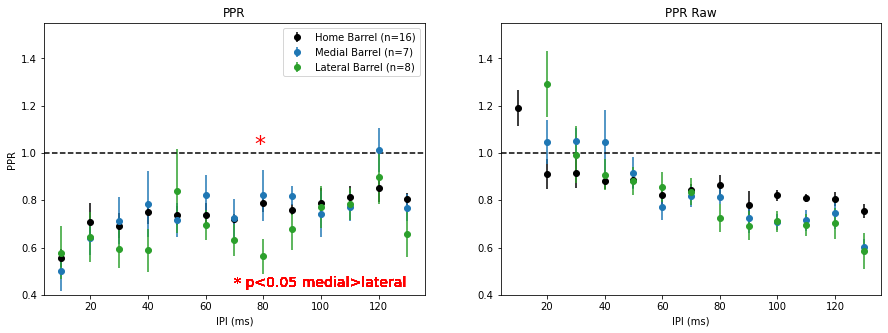

In [49]:
# plot the PPR and PPR Composed, separated by IPI, separated 
# for home barrel (ROI = 1), medial barrel, and lateral barrel (Medial/Lateral columns)
# group by IPI, and Medial/Lateral columns
ppr_coronal_grouped = ppr_coronal_df.groupby(['IPI', 'Medial/Lateral'])
handles = []
# plot PPR and PPR Composed
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
for (ipi, medial_lateral), group in ppr_coronal_grouped:
    #print(ipi, medial_lateral)
    color = 'tab:green' if medial_lateral == 'Medial' else 'tab:blue' if medial_lateral == 'Lateral' else 'black'
    group = group.dropna()
    # plot as scatter plot with error bars
    # include only values from 0 - 2
    group_ppr = group[(group['PPR'] > 0) & (group['PPR'] < 2)]
    h = ax[0].errorbar(ipi, group_ppr['PPR'].mean(), yerr=sem(group_ppr['PPR']), fmt='o', label=medial_lateral, color=color)
    handles.append(h)

    group_ppr_composed = group[(group['PPR Composed'] > 0) & (group['PPR Composed'] < 2)]
    ax[1].errorbar(ipi, group_ppr_composed['PPR Composed'].mean(), 
                    yerr=sem(group_ppr_composed['PPR Composed']), color=color, 
                    fmt='o', label=medial_lateral)

    # label the sample size for each point on the PPR composed plot
    '''ax[1].annotate(f"n={len(group_ppr_composed)}", 
                (ipi-5, 
                        (-.3 if medial_lateral == 'Medial' else .1 if medial_lateral == 'Lateral' else -.6) +
                        group_ppr_composed['PPR Composed'].mean()+
                        sem(group_ppr_composed['PPR Composed'])
                        ), color=color)'''

ax[0].legend(handles=handles[:3], labels=['Home Barrel (n=16)', 'Medial Barrel (n=7)', 'Lateral Barrel (n=8)'])
ax[0].set_ylim(0.4, 1.55)
ax[1].set_ylim(0.4, 1.55)
ax[0].set_title("PPR")
ax[1].set_title("PPR Raw")
ax[0].set_xlabel("IPI (ms)")
ax[1].set_xlabel("IPI (ms)")
ax[0].set_ylabel("PPR")

# horizontal line at 1 for reference
ax[0].axhline(1, color='black', linestyle='--')
ax[1].axhline(1, color='black', linestyle='--')

# significance testing with bonferroni correction
# for each IPI, test if medial and lateral PPR are different
# use t-test with bonferroni correction
ppr_coronal_grouped_ipi = ppr_coronal_df.groupby('IPI')
for ipi, group in ppr_coronal_grouped_ipi:
    group_medial = group[group['Medial/Lateral'] == 'Medial']
    group_lateral = group[group['Medial/Lateral'] == 'Lateral']
    # only include values from 0 - 2
    group_medial = group_medial[(group_medial['PPR'] > 0)]
    group_lateral = group_lateral[(group_lateral['PPR'] > 0)]

    # filter out NaNs
    group_medial = list(group_medial['PPR'].dropna())
    group_lateral = list(group_lateral['PPR'].dropna())

    t, p = ttest_ind(group_medial, group_lateral, nan_policy="omit", alternative='less')
    if p < 0.05:
        print(f"Significant difference at IPI {ipi}ms, p={p:.4f}")
        ax[0].annotate("*", (ipi-3, 1.01), color='red', fontsize=22)
    else:
        print(f"No significant difference at IPI {ipi}ms, p={p:.4f}")

    # annotate in the bottom right of PPR plot what the p-value star means
    ax[0].annotate("* p<0.05 medial>lateral", (0.5, 0.03), color='red', fontsize=14, xycoords='axes fraction')

# significance testing. Which IPIs are significantly less than mean 1?
ppr_coronal_grouped_ipi_md = ppr_coronal_df.groupby(['IPI', 'Medial/Lateral'])
p_values = []
for (ipi, medial_lateral), group in ppr_coronal_grouped_ipi_md:
    print(ipi, medial_lateral)
    color = 'tab:green' if medial_lateral == 'Medial' else 'tab:blue' if medial_lateral == 'Lateral' else 'black'
    group = group[(group['PPR'] > 0)]
    group = list(group['PPR'].dropna())

    # compare to a norm dist with mean 1 and equal var
    norm_distr = norm(loc=1, scale=np.std(group)).rvs(size=len(group))
    print(group, norm_distr)
    
    t, p = ttest_ind(group, norm_distr, nan_policy="omit", alternative='less')
    p_values.append(p)
p_values_corrected = false_discovery_control(p_values)


i = -1
# correct p-value with bonferroni correction based on number of hypotheses
for (ipi, medial_lateral), group in ppr_coronal_grouped_ipi_md:
    i += 1
    p = p_values_corrected[i]
    color = 'tab:green' if medial_lateral == 'Medial' else 'tab:blue' if medial_lateral == 'Lateral' else 'black'

    if p < 0.05:
        print(f"Significant difference at IPI {ipi}ms, p={p:.4f}")
        boost = 0.05 if medial_lateral == 'Medial' else 0.1 if medial_lateral == 'Lateral' else 0
        #ax[0].annotate("*", (ipi-3, 1.05 + boost), color=color, fontsize=22)
    else:
        print(f"No significant difference from 1 at IPI {ipi}ms, p={p:.4f}")

plt.savefig(f"{data_dir}PPR_composed_medial_lateral.png")
plt.show()

In [42]:

# rename 'Medial/Lateral' to 
# add column 'Medial_Lateral' and 'PPR_Composed'
ppr_coronal_df['Medial_Lateral'] = ppr_coronal_df['Medial/Lateral']
ppr_coronal_df['PPR_Composed'] = ppr_coronal_df['PPR Composed']


Index(['ROI', 'amp', 'latency', 'halfwidth', 'X_Center', 'Y_Center', 'ROI_Set',
       'Date', 'Slice', 'Location', 'Recording', 'trace', 'trace_non_polyfit',
       'amp_array', 'Medial_Lateral', 'IPI', 'is_single_pulse_control',
       'zda_id', 'Trace Sub Dist', 'MaxAmp 1', 'MaxAmp 2', 'MaxAmp 1 Composed',
       'MaxAmp 2 Composed', 'PPR_Composed', 'PPR', 'Medial/Lateral',
       'PPR Composed'],
      dtype='object')

In [48]:
# 2-way ANOVA for medial and lateral PPR vs IPI
model = ols('PPR ~ IPI + C(Medial_Lateral) + IPI:C(Medial_Lateral)', data=ppr_coronal_df[ppr_coronal_df['Medial_Lateral'] != 'Home']).fit()
anova_table = anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(Medial_Lateral),4.264810,1.0,2.804229,0.095564
IPI,3.795453,1.0,2.495614,0.115728
IPI:C(Medial_Lateral),8.605764,1.0,5.658525,0.018303
Residual,307.211587,202.0,NaN,NaN


## 